In [985]:
#import file
from google.colab import files
uploaded = files.upload()

Saving Employers_data.csv to Employers_data (11).csv


In [986]:
#improt the librays
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')

In [987]:
df=pd.read_csv('Employers_data (11).csv')
df

,Employee_ID,Name,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,1,Merle Ingram,24,Female,Engineering,Engineer,1,Master,Austin,90000
1,2,John Mayes,56,Male,Sales,Executive,33,Master,Seattle,195000
2,3,Carlos Wille,21,Male,Engineering,Intern,1,Bachelor,New York,35000
3,4,Michael Bryant,30,Male,Finance,Analyst,9,Bachelor,New York,75000
4,5,Paula Douglas,25,Female,HR,Analyst,2,Master,Seattle,70000
...,...,...,...,...,...,...,...,...,...,...
9995,9996,Thomas Rossin,51,Male,Sales,Executive,28,Master,Austin,185000
9996,9997,Christie King,36,Female,Sales,Executive,9,PhD,San Francisco,165000
9997,9998,Alfred Keller,57,Male,Sales,Executive,30,PhD,New York,200000
9998,9999,Margaret Gomez,37,Female,Engineering,Manager,14,Master,New York,135000


In [988]:
df.ndim

2

In [989]:
df.shape

(10000, 10)

In [990]:
df["Department"].unique()

array(['Engineering', 'Sales', 'Finance', 'HR', 'Marketing', 'Product'],
      dtype=object)

In [991]:
df.isnull().sum()

,0
Employee_ID,0
Name,0
Age,0
Gender,0
Department,0
Job_Title,0
Experience_Years,0
Education_Level,0
Location,0
Salary,0


In [992]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Employee_ID       10000 non-null  int64 
 1   Name              10000 non-null  object
 2   Age               10000 non-null  int64 
 3   Gender            10000 non-null  object
 4   Department        10000 non-null  object
 5   Job_Title         10000 non-null  object
 6   Experience_Years  10000 non-null  int64 
 7   Education_Level   10000 non-null  object
 8   Location          10000 non-null  object
 9   Salary            10000 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 781.4+ KB


In [993]:
# Step 1: Remove unnecessary columns
df.drop(['Employee_ID','Name'], axis=1, inplace=True)

In [994]:
df.describe()

,Age,Experience_Years,Salary
count,10000.000000,10000.000000,10000.000000
mean,35.455900,12.370900,115381.500000
std,10.000213,9.148951,46066.139047
min,21.000000,0.000000,25000.000000
25%,27.000000,5.000000,70000.000000
50%,34.000000,10.000000,120000.000000
75%,43.000000,19.000000,150000.000000
max,60.000000,37.000000,215000.000000


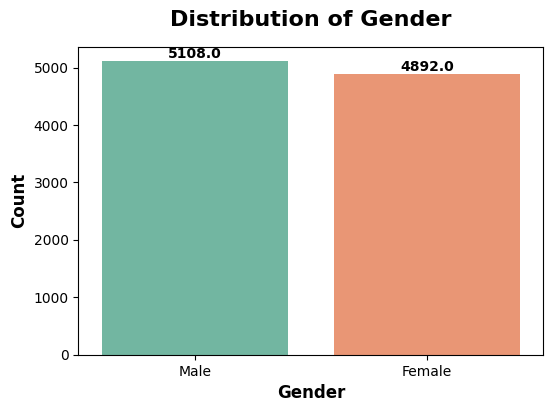

In [995]:
plt.figure(figsize=(6,4))
ax = sns.countplot(data=df, x="Gender", palette="Set2", order=df["Gender"].value_counts().index)

plt.title("Distribution of Gender", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Gender", fontsize=12, fontweight="bold")
plt.ylabel("Count", fontsize=12, fontweight="bold")

for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom', fontsize=10, fontweight="bold")

plt.show()


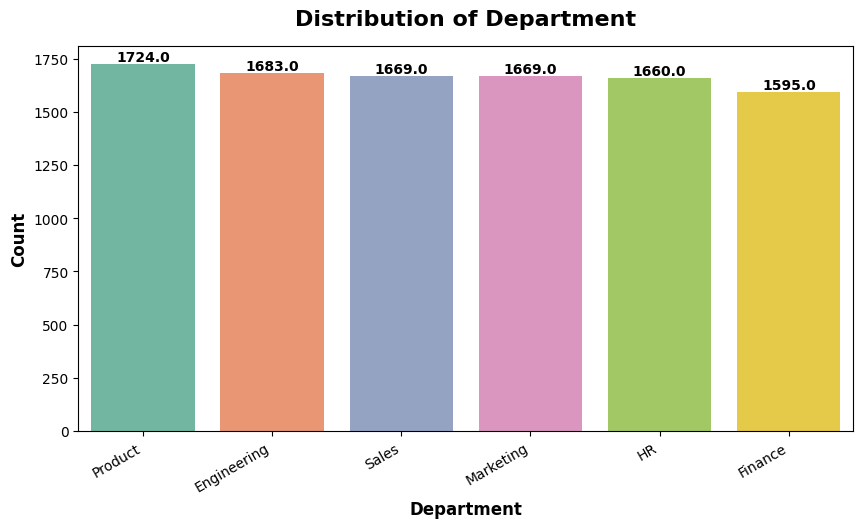

In [996]:
plt.figure(figsize=(10,5))
ax = sns.countplot(data=df, x="Department", palette="Set2", order=df["Department"].value_counts().index)

plt.title("Distribution of Department", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Department", fontsize=12, fontweight="bold")
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xticks(rotation=30, ha="right")

for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom', fontsize=10, fontweight="bold")

plt.show()


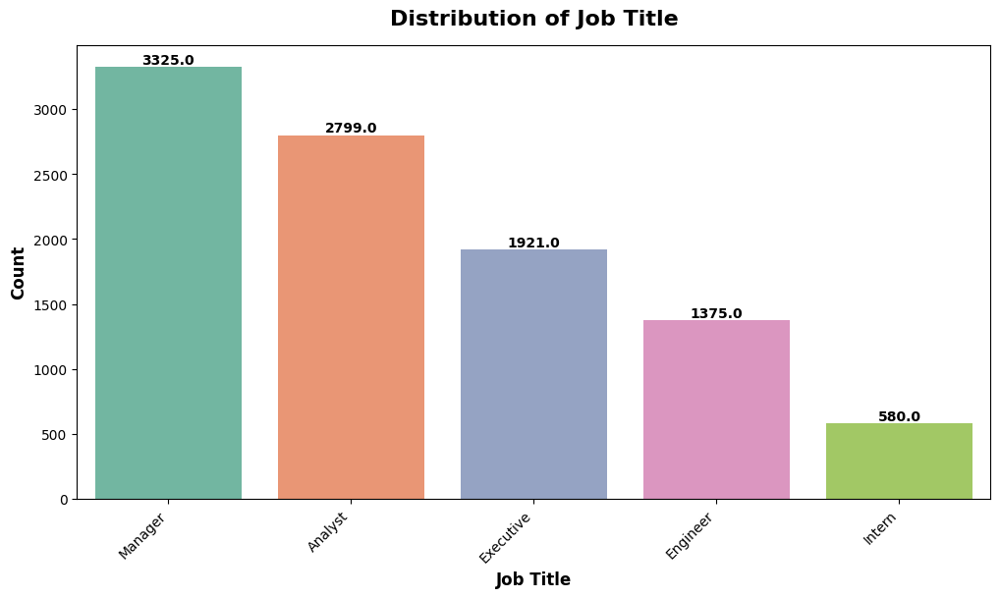

In [997]:
plt.figure(figsize=(12,6))
ax = sns.countplot(data=df, x="Job_Title", palette="Set2", order=df["Job_Title"].value_counts().index)

plt.title("Distribution of Job Title", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Job Title", fontsize=12, fontweight="bold")
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xticks(rotation=45, ha="right")

for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom', fontsize=10, fontweight="bold")

plt.show()


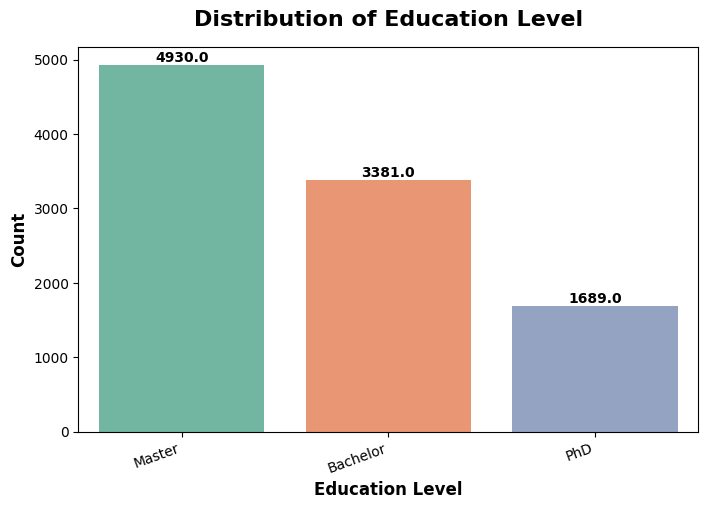

In [998]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data=df, x="Education_Level", palette="Set2", order=df["Education_Level"].value_counts().index)

plt.title("Distribution of Education Level", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Education Level", fontsize=12, fontweight="bold")
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xticks(rotation=20, ha="right")

for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom', fontsize=10, fontweight="bold")

plt.show()


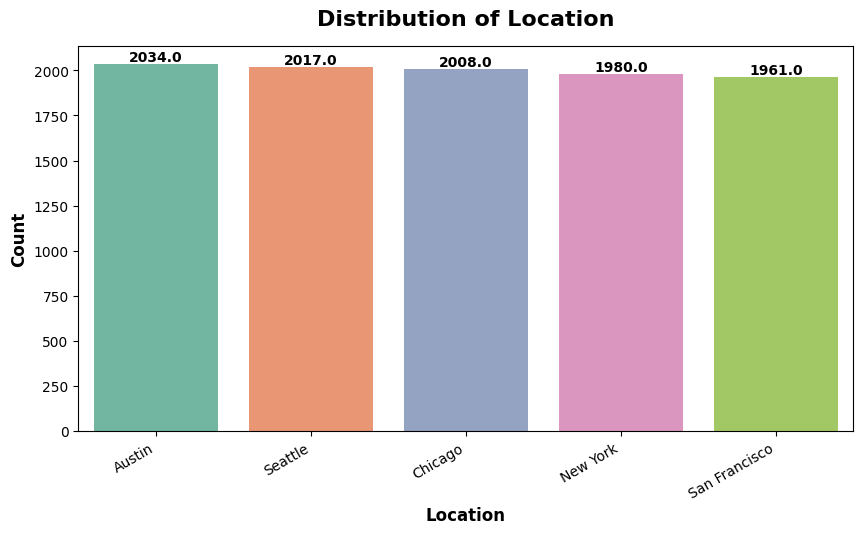

In [999]:
plt.figure(figsize=(10,5))
ax = sns.countplot(data=df, x="Location", palette="Set2", order=df["Location"].value_counts().index)

plt.title("Distribution of Location", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Location", fontsize=12, fontweight="bold")
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xticks(rotation=30, ha="right")

for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom', fontsize=10, fontweight="bold")

plt.show()


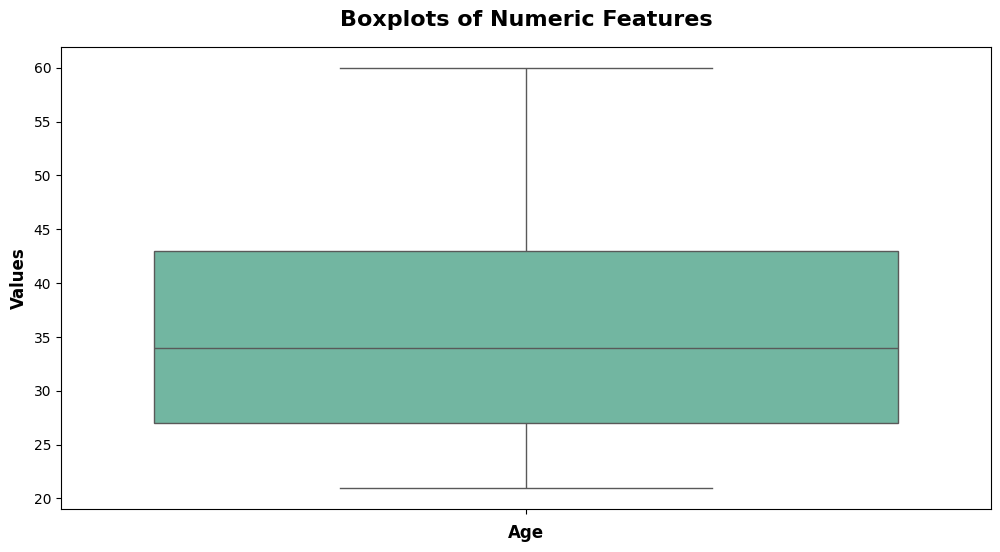

In [1000]:
# Select numeric columns
numeric_cols = ["Age", "Experience_Years", "Salary"]
df_numeric = df[numeric_cols]

# Calculate Z-scores
z_scores = np.abs((df_numeric - df_numeric.mean()) / df_numeric.std())
outliers = z_scores > 3

# ==============================
#  Boxplots for Each Feature
# ==============================
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_numeric["Age"], palette="Set2")
plt.title("Boxplots of Numeric Features", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Age", fontsize=12, fontweight="bold")
plt.ylabel("Values", fontsize=12, fontweight="bold")
plt.show()


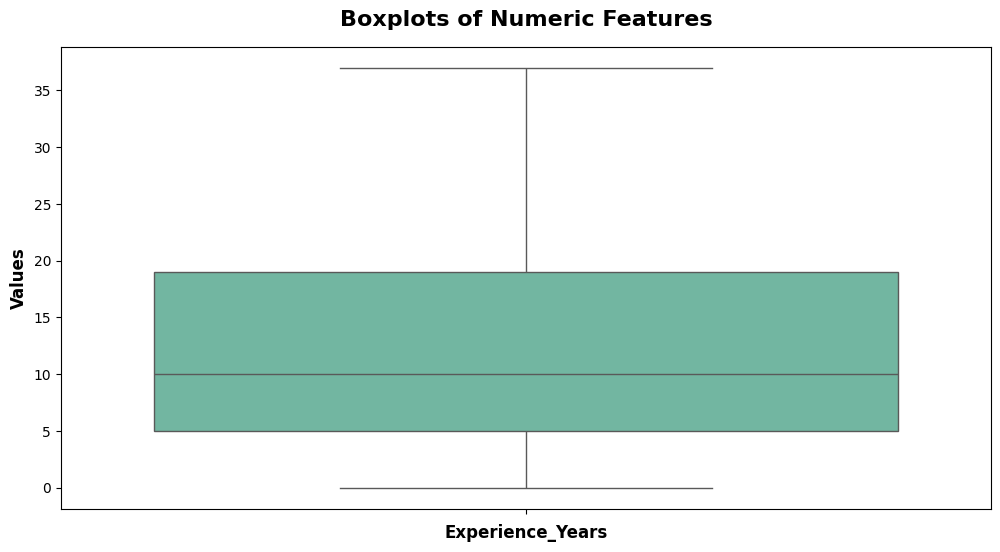

In [1001]:
# ==============================
#  Boxplots for Each Feature
# ==============================
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_numeric["Experience_Years"], palette="Set2")
plt.title("Boxplots of Numeric Features", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Experience_Years", fontsize=12, fontweight="bold")
plt.ylabel("Values", fontsize=12, fontweight="bold")
plt.show()

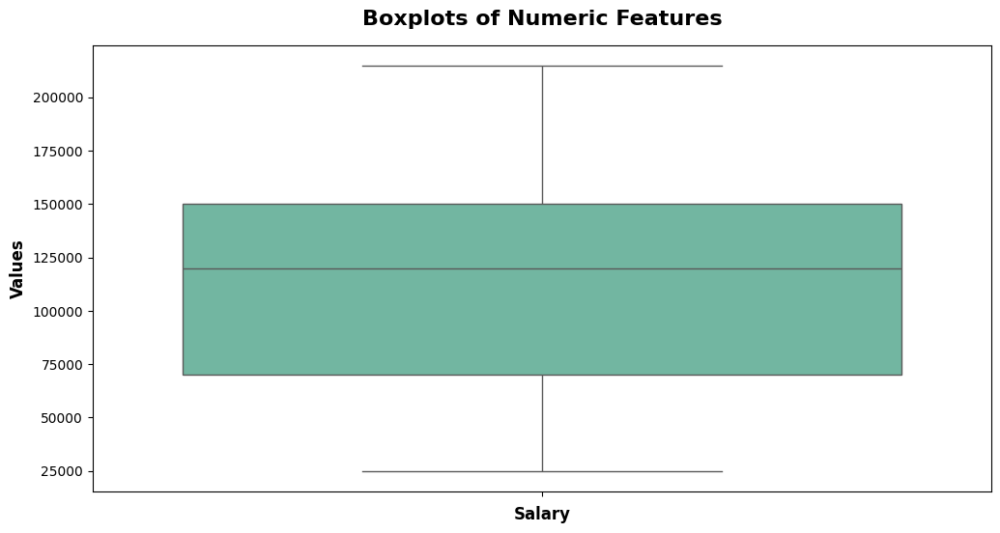

In [1002]:
# ==============================
#  Boxplots for Each Feature
# ==============================
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_numeric["Salary"], palette="Set2")
plt.title("Boxplots of Numeric Features", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Salary", fontsize=12, fontweight="bold")
plt.ylabel("Values", fontsize=12, fontweight="bold")
plt.show()

In [1003]:
# ==============================
#  Outlier Counts
# ==============================
outlier_counts = outliers.sum().sort_values(ascending=False)
print("Number of outliers per feature:\n")
print(outlier_counts)

Number of outliers per feature:

Age                 0
Experience_Years    0
Salary              0
dtype: int64


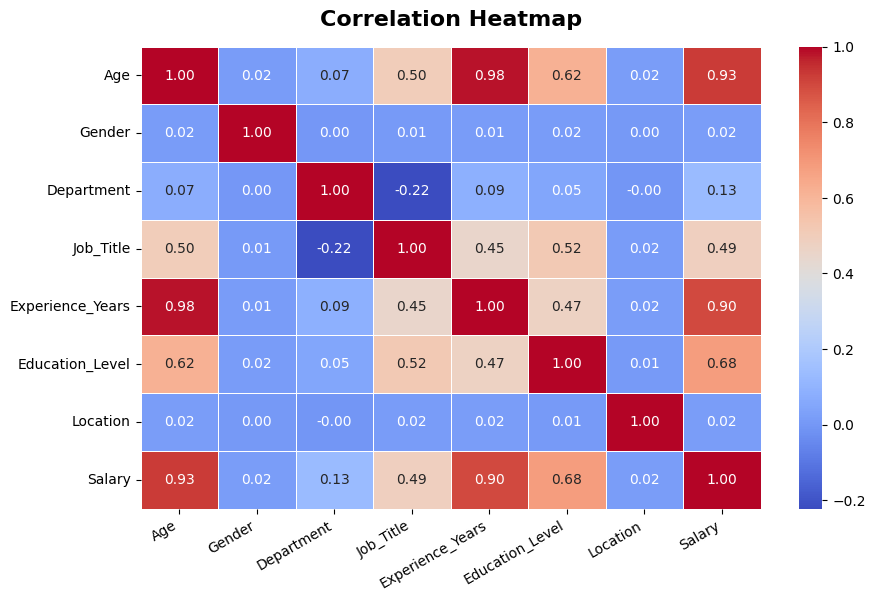

In [1004]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Copy dataframe
df_encoded = df.copy()

# Drop 'Name' since it's unique (not useful for correlation)
if 'Name' in df_encoded.columns:
    df_encoded = df_encoded.drop(columns=["Name"]).copy()

# Columns
cols = ["Age", "Gender", "Department", "Job_Title",
        "Experience_Years", "Education_Level", "Location", "Salary"]

# Ensure all columns in 'cols' exist in df_encoded before proceeding
cols_in_df_encoded = [col for col in cols if col in df_encoded.columns]

# Encode categorical columns
categorical_cols = ["Gender", "Department", "Job_Title", "Education_Level", "Location"]
le = LabelEncoder()

for col in categorical_cols:
    if col in df_encoded.columns: # Added check for categorical columns
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))

# Compute correlation matrix
corr_matrix = df_encoded[cols_in_df_encoded].corr()

# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

plt.title("Correlation Heatmap", fontsize=16, fontweight="bold", pad=15)
plt.xticks(rotation=30, ha="right", fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.show()

In [1005]:
df["Department"].unique()

array(['Engineering', 'Sales', 'Finance', 'HR', 'Marketing', 'Product'],
      dtype=object)


# **Explanation & Justification**



*   When analyzing the relationship between different employee attributes and salary, it is important to consider that the effect of these variables may not be uniform across all employees. For example, the factors that drive the salary of an Engineer may be very different from those that determine the salary of a Sales Executive or an HR Manager. If we calculate the correlation of all features with salary using the entire dataset at once, the results may be misleading because the patterns from one department can overshadow or dilute the patterns from another.
*   If we calculate correlations across the entire dataset without separating departments, the effects of these different structures get mixed together. This mixing reduces the clarity of the results and may lead to misleading correlations. For example, the relationship between Experience_Years and Salary may appear weaker in the overall dataset because the experience-salary relationship is very different for an Engineer compared to a Sales Executive.




*   To address this, we will divide the dataset into six subsets based on the Department variable: Engineering, Sales, Finance, HR, Marketing, and Product. By doing so, we ensure that the correlation analysis is carried out within each department independently. This will make the results more meaningful, as the correlation of variables such as Age, Job Title, Education Level, and Experience with salary will be analyzed in the correct departmental context.
*   Once the department-wise correlations are identified, we will proceed to build separate salary prediction models for each department. This approach allows us to capture department-specific salary patterns more accurately rather than applying a single general model across the entire dataset. In the end, this methodology will provide more reliable insights and improve the prediction accuracy of our machine learning models.

# **Problem Statement Engineering:**


*   The overall correlation between employee features and salary may be misleading due to differences across departments. To understand the specific factors influencing salaries in Engineering, we first need to isolate this department from the dataset.



# **Justification:**


*  Engineering salaries are typically driven by factors like Experience_Years and Education_Level, which may not have the same impact in other departments such as Sales or HR. By analyzing only the Engineering subset, we can uncover precise relationships between these features and salary, avoid noise from unrelated departments, and build more accurate predictive models tailored for Engineering employees.



In [1006]:
engineering_df = df[df["Department"] == "Engineering"]

In [1007]:
engineering_df

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,Female,Engineering,Engineer,1,Master,Austin,90000
2,21,Male,Engineering,Intern,1,Bachelor,New York,35000
15,47,Male,Engineering,Manager,24,Master,New York,150000
24,28,Male,Engineering,Engineer,1,PhD,Chicago,90000
36,35,Male,Engineering,Manager,12,Master,New York,125000
...,...,...,...,...,...,...,...,...
9980,22,Male,Engineering,Intern,0,Bachelor,New York,35000
9985,23,Female,Engineering,Intern,0,Bachelor,Austin,35000
9986,39,Female,Engineering,Manager,16,Master,New York,140000
9991,38,Female,Engineering,Manager,15,Master,New York,125000


In [1008]:
# Reset index
engineering_df = engineering_df.reset_index(drop=True)

In [ ]:
engineering_df

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,Female,Engineering,Engineer,1,Master,Austin,90000
1,21,Male,Engineering,Intern,1,Bachelor,New York,35000
2,47,Male,Engineering,Manager,24,Master,New York,150000
3,28,Male,Engineering,Engineer,1,PhD,Chicago,90000
4,35,Male,Engineering,Manager,12,Master,New York,125000
...,...,...,...,...,...,...,...,...
1678,22,Male,Engineering,Intern,0,Bachelor,New York,35000
1679,23,Female,Engineering,Intern,0,Bachelor,Austin,35000
1680,39,Female,Engineering,Manager,16,Master,New York,140000
1681,38,Female,Engineering,Manager,15,Master,New York,125000


In [1009]:
#droping Department colume
engineering_df.drop("Department", axis=1, inplace=True)


In [1010]:
engineering_df

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,Female,Engineer,1,Master,Austin,90000
1,21,Male,Intern,1,Bachelor,New York,35000
2,47,Male,Manager,24,Master,New York,150000
3,28,Male,Engineer,1,PhD,Chicago,90000
4,35,Male,Manager,12,Master,New York,125000
...,...,...,...,...,...,...,...
1678,22,Male,Intern,0,Bachelor,New York,35000
1679,23,Female,Intern,0,Bachelor,Austin,35000
1680,39,Female,Manager,16,Master,New York,140000
1681,38,Female,Manager,15,Master,New York,125000


In [1011]:
# Check the shape of the dataframe
print("Shape of Engineering DF:", engineering_df.shape)


Shape of Engineering DF: (1683, 7)


In [1012]:
# Check data types of each column
print("\nData Types:\n", engineering_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [1013]:
# List categorical columns
categorical_cols = engineering_df.select_dtypes(include='object').columns
print("\nCategorical Columns:", categorical_cols)

# Print unique values for each categorical column
for col in categorical_cols:
    print(f"\nUnique values in {col}: {engineering_df[col].unique()}")


Categorical Columns: Index(['Gender', 'Job_Title', 'Education_Level', 'Location'], dtype='object')

Unique values in Gender: ['Female' 'Male']

Unique values in Job_Title: ['Engineer' 'Intern' 'Manager']

Unique values in Education_Level: ['Master' 'Bachelor' 'PhD']

Unique values in Location: ['Austin' 'New York' 'Chicago' 'Seattle' 'San Francisco']


In [1014]:
engineering_df.ndim

2

In [1015]:
engineering_df.describe()

,Age,Experience_Years,Salary
count,1683.000000,1683.000000,1683.000000
mean,31.693405,8.692216,90680.332739
std,8.527907,8.047812,43331.438547
min,21.000000,0.000000,25000.000000
25%,24.000000,1.000000,40000.000000
50%,31.000000,8.000000,100000.000000
75%,38.000000,15.000000,130000.000000
max,50.000000,27.000000,160000.000000


In [1016]:
# 1. Gender Distribution
engineering_df['Gender'].value_counts()

,count
Gender,
Female,849
Male,834


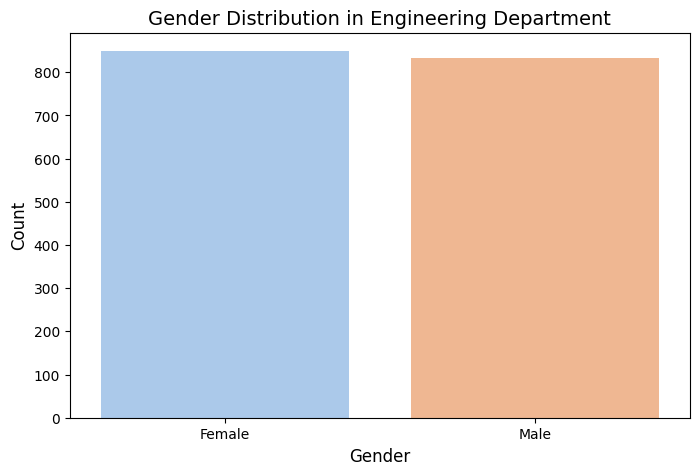

In [1017]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=engineering_df, palette='pastel')
plt.title('Gender Distribution in Engineering Department', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [1018]:
# 2. Job_Title Distribution
engineering_df['Job_Title'].value_counts()

,count
Job_Title,
Manager,616
Intern,580
Engineer,487


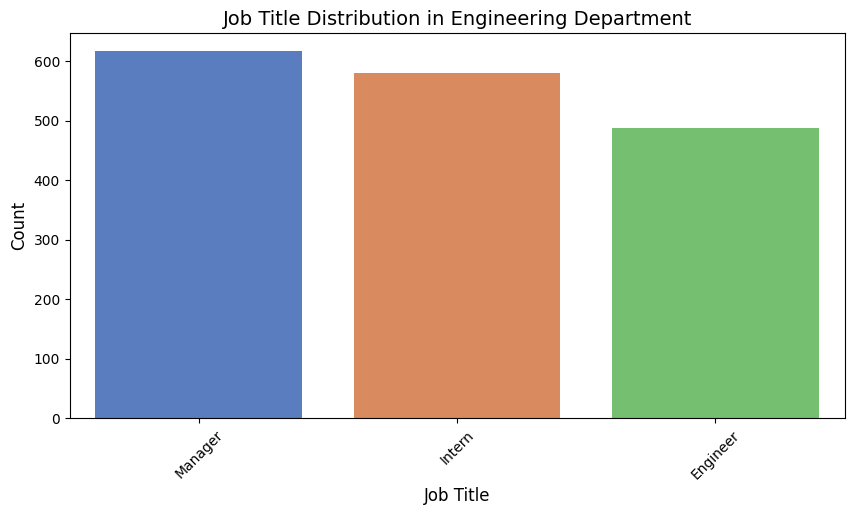

In [1019]:
plt.figure(figsize=(10,5))
sns.countplot(x='Job_Title', data=engineering_df, palette='muted', order=engineering_df['Job_Title'].value_counts().index)
plt.title('Job Title Distribution in Engineering Department', fontsize=14)
plt.xlabel('Job Title', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [1020]:
# 3.Education Level Distribution
engineering_df['Education_Level'].value_counts()

,count
Education_Level,
Bachelor,831
Master,650
PhD,202


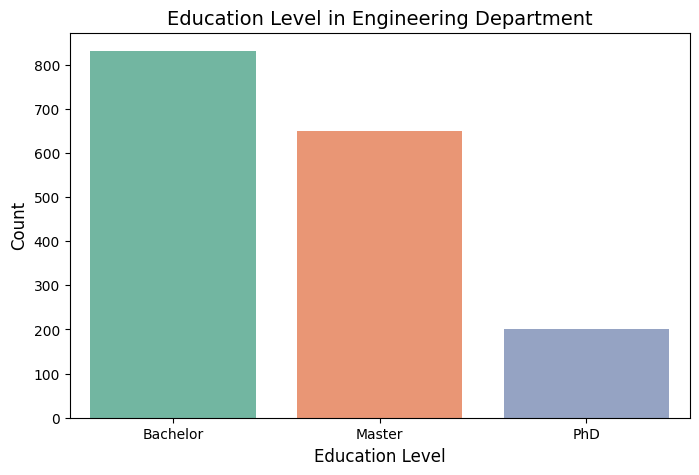

In [1021]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education_Level', data=engineering_df, palette='Set2', order=engineering_df['Education_Level'].value_counts().index)
plt.title('Education Level in Engineering Department', fontsize=14)
plt.xlabel('Education Level', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [1022]:
# 4.Location Distribution
engineering_df['Location'].value_counts()

,count
Location,
Austin,351
San Francisco,349
Chicago,340
Seattle,326
New York,317


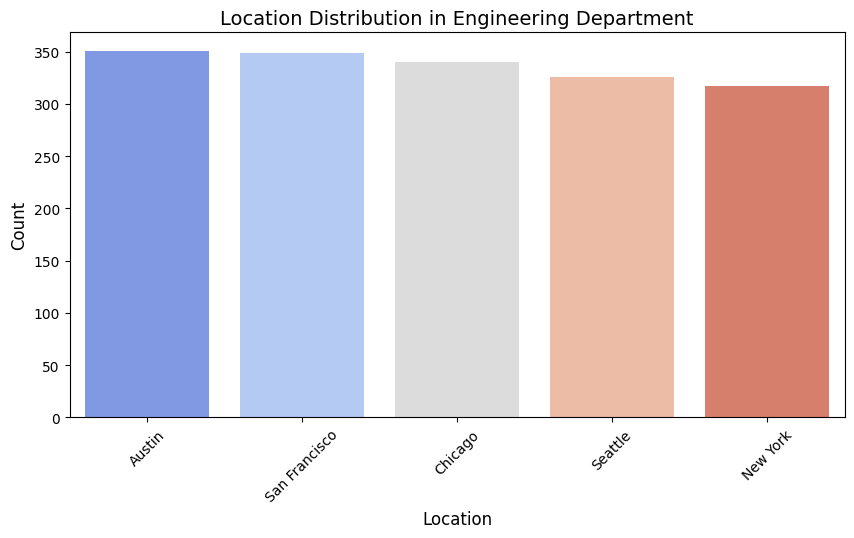

In [1023]:
plt.figure(figsize=(10,5))
sns.countplot(x='Location', data=engineering_df, palette='coolwarm', order=engineering_df['Location'].value_counts().index)
plt.title('Location Distribution in Engineering Department', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [1025]:
# Function to calculate outliers
def find_outliers(column):
    Q1 = engineering_df[column].quantile(0.25)
    Q3 = engineering_df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = engineering_df[(engineering_df[column] < lower_bound) | (engineering_df[column] > upper_bound)]
    print(f"\n{column} Outliers:")
    print(outliers[column].values)


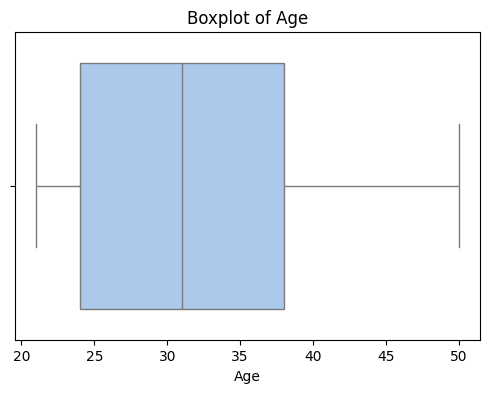


Age Outliers:
[]


In [1026]:
# Age
plt.figure(figsize=(6,4))
sns.boxplot(x=engineering_df['Age'], palette='pastel')
plt.title('Boxplot of Age')
plt.show()

# Check outliers for Age columns
find_outliers('Age')




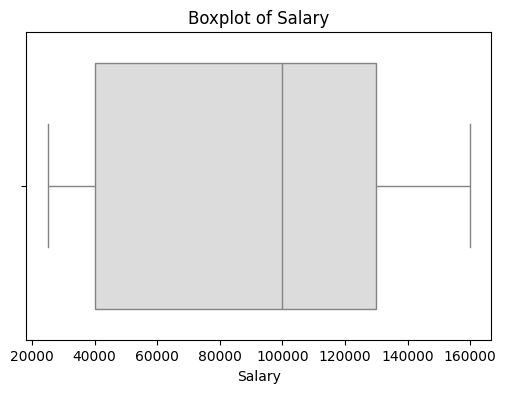


Salary Outliers:
[]


In [1027]:
# Salary
plt.figure(figsize=(6,4))
sns.boxplot(x=engineering_df['Salary'], palette='coolwarm')
plt.title('Boxplot of Salary')
plt.show()

# Check outliers for Salary columns
find_outliers('Salary')

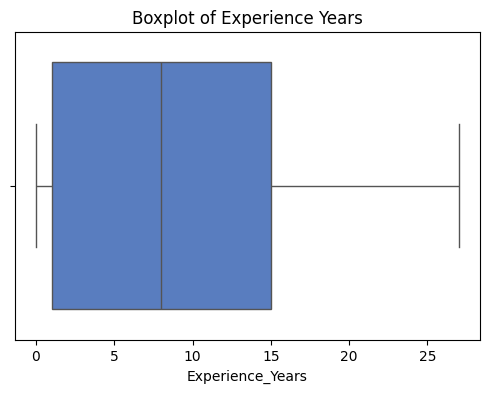


Experience_Years Outliers:
[]


In [1028]:

# Experience Years
plt.figure(figsize=(6,4))
sns.boxplot(x=engineering_df['Experience_Years'], palette='muted')
plt.title('Boxplot of Experience Years')
plt.show()

# Check outliers for Experience_Years columns
find_outliers('Experience_Years')


In [1029]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Define categorical columns
cat_cols = ['Gender', 'Job_Title', 'Education_Level', 'Location']

# Step 2: Initialize LabelEncoder
le = LabelEncoder()

# Step 3: Apply LabelEncoder to each categorical column
for col in cat_cols:
    engineering_df[col] = le.fit_transform(engineering_df[col])

# Step 4: Check the encoded dataframe
engineering_df.head()


,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,0,0,1,1,0,90000
1,21,1,1,1,0,2,35000
2,47,1,2,24,1,2,150000
3,28,1,0,1,2,1,90000
4,35,1,2,12,1,2,125000


In [1030]:
engineering_df1=engineering_df

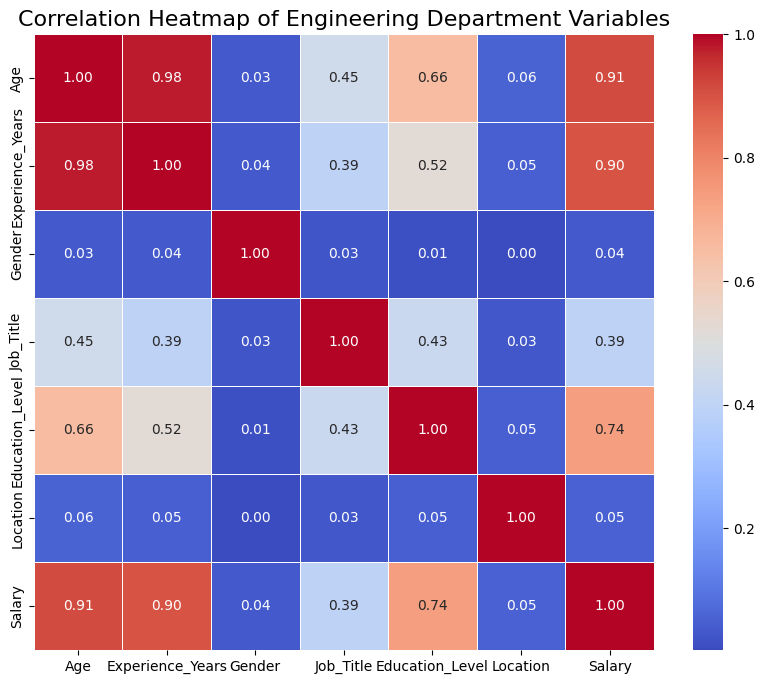

In [1031]:
# Select the 7 variables
cols = ['Age', 'Experience_Years', 'Gender', 'Job_Title', 'Education_Level', 'Location', 'Salary']
# Calculate correlation
corr = engineering_df[cols].corr()
# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='white', cbar=True)
plt.title('Correlation Heatmap of Engineering Department Variables', fontsize=16)
plt.show()

In [1032]:
#corelation
corr

,Age,Experience_Years,Gender,Job_Title,Education_Level,Location,Salary
Age,1.000000,0.976939,0.033971,0.451124,0.657134,0.055512,0.913518
Experience_Years,0.976939,1.000000,0.037769,0.393193,0.523141,0.048579,0.897861
Gender,0.033971,0.037769,1.000000,0.025179,0.013285,0.002775,0.035050
Job_Title,0.451124,0.393193,0.025179,1.000000,0.433881,0.026544,0.394554
Education_Level,0.657134,0.523141,0.013285,0.433881,1.000000,0.049010,0.736028
Location,0.055512,0.048579,0.002775,0.026544,0.049010,1.000000,0.052026
Salary,0.913518,0.897861,0.035050,0.394554,0.736028,0.052026,1.000000


In [1033]:
# Calculate correlation
corr = engineering_df[cols].corr()

# Select independent variables with correlation > 0.7 with Salary
engineering_df_iv = corr['Salary'][abs(corr['Salary']) > 0.7].index.tolist()

# Remove 'Salary' itself
engineering_df_iv = [var for var in engineering_df_iv if var != 'Salary']

print("Selected Independent Variables for Salary (correlation > 0.7):")
engineering_df_iv

Selected Independent Variables for Salary (correlation > 0.7):


['Age', 'Experience_Years', 'Education_Level']

In [1034]:
#creating the model
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Independent and dependent variables
X = engineering_df[['Age', 'Experience_Years', 'Education_Level']]
y = engineering_df['Salary']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize independent variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models_engineering = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'SVR': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
}

# Evaluate models
results = []

for name, model in models_engineering.items():
    model.fit(X_train_scaled, y_train)
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    overall_acc = (train_r2 + test_r2) / 2

    results.append({
        'Model': name,
        'Training Accuracy (R2)': round(train_r2, 3),
        'Testing Accuracy (R2)': round(test_r2, 3),
        'Overall Accuracy': round(overall_acc, 3)
    })

# Display results
results_df = pd.DataFrame(results)
print(results_df)


               Model  Training Accuracy (R2)  Testing Accuracy (R2)  \
0  Linear Regression                   0.922                  0.920   
1   Ridge Regression                   0.922                  0.920   
2   Lasso Regression                   0.922                  0.920   
3      Decision Tree                   0.980                  0.976   
4      Random Forest                   0.980                  0.976   
5  Gradient Boosting                   0.980                  0.976   
6                SVR                   0.653                  0.631   

   Overall Accuracy  
0             0.921  
1             0.921  
2             0.921  
3             0.978  
4             0.978  
5             0.978  
6             0.642  


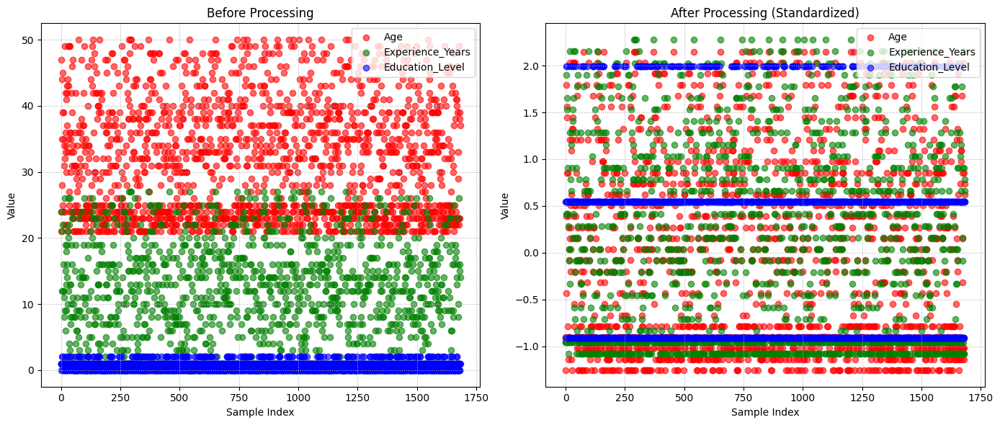

In [1035]:
# Select only the three features of interest
features = ['Age', 'Experience_Years', 'Education_Level']
colors = ['red', 'green', 'blue']

# Take only those columns before scaling
X_selected = engineering_df1[features]   # before processing
X_scaled_selected = scaler.fit_transform(X_selected)  # after processing

plt.figure(figsize=(14,6))

# Plot 1: Before processing
plt.subplot(1,2,1)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_selected[feature])), y=X_selected[feature],
                color=color, alpha=0.6, label=feature, marker='o')
plt.title("Before Processing")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')

# Plot 2: After processing (standardized)
plt.subplot(1,2,2)
X_scaled_df = pd.DataFrame(X_scaled_selected, columns=features)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_scaled_df[feature])), y=X_scaled_df[feature],
                color=color, alpha=0.6, label=feature, marker='o')
plt.title("After Processing (Standardized)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')

plt.tight_layout()
plt.show()


In [1036]:
engineering_df.head(2)

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,0,0,1,1,0,90000
1,21,1,1,1,0,2,35000


In [1037]:
# Input your new data here
# Example: Age=21, Experience_Years=1, Education_Level=0
new_data = np.array([[21, 1, 0]])

# Standardize the input using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using trained Random Forest model
engineering = models_engineering['Random Forest'].predict(new_data_scaled)

print(f"Predicted Salary: {engineering[0]:.2f}")

Predicted Salary: 35975.16


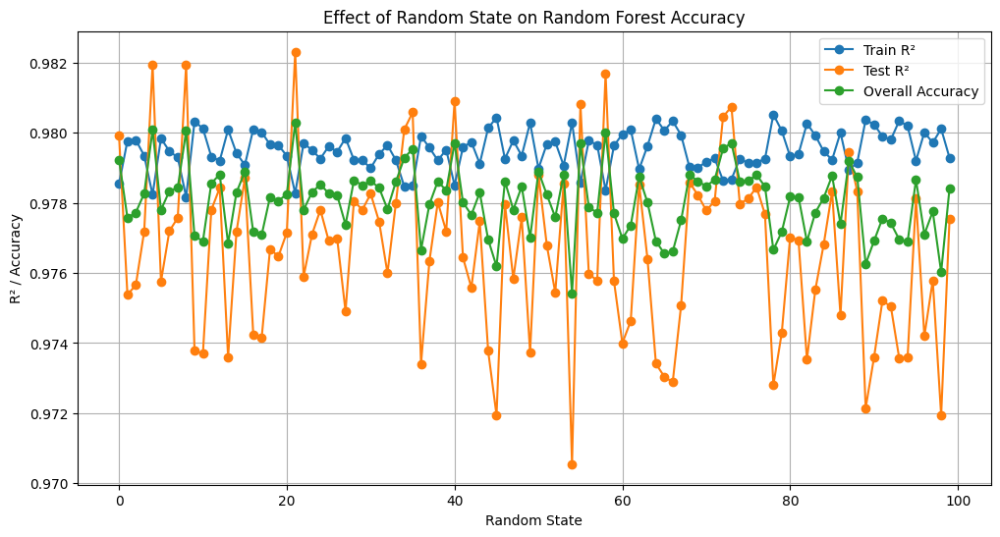

In [1038]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Store results
random_states = list(range(0, 100))  # Random states 0 to 100
train_acc = []
test_acc = []
overall_acc = []

for rs in random_states:
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rs)

    model = RandomForestRegressor(n_estimators=100, random_state=rs)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2_val = r2_score(y_test, y_test_pred)
    overall_r2 = (train_r2 + test_r2_val) / 2

    train_acc.append(train_r2)
    test_acc.append(test_r2_val)
    overall_acc.append(overall_r2)

# Plot results
plt.figure(figsize=(12,6))
plt.plot(random_states, train_acc, marker='o', label='Train R²')
plt.plot(random_states, test_acc, marker='o', label='Test R²')
plt.plot(random_states, overall_acc, marker='o', label='Overall Accuracy')
plt.xlabel('Random State')
plt.ylabel('R² / Accuracy')
plt.title('Effect of Random State on Random Forest Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [1039]:
from ipywidgets import interact, widgets
from IPython.display import display

# Assuming scaler and trained Random Forest model already exist:
# scaler
# models['Random Forest']

# Dropdown for Education Level
edu_dropdown = widgets.Dropdown(
    options=['Bachelor', 'Master', 'PhD'],
    value='Bachelor',
    description='Education:',
    style={'description_width': 'initial'}
)
# Sliders for Age and Experience
age_slider = widgets.IntSlider(
    value=25,
    min=18,
    max=65,
    step=1,
    description='Age:',
    style={'description_width': 'initial'}
)
exp_slider = widgets.IntSlider(
    value=2,
    min=0,
    max=40,
    step=1,
    description='Experience (Years):',
    style={'description_width': 'initial'}
)
# Button for Prediction
predict_button = widgets.Button(
    description="Predict Salary",
    button_style='success',
    tooltip="Click to predict salary",
    icon='check'
)
output = widgets.Output()

# Encode Education
edu_map = {'Bachelor': 0, 'Master': 1, 'PhD': 2}

def on_predict_clicked(b):
    with output:
        output.clear_output()
        age = age_slider.value
        exp = exp_slider.value
        edu_encoded = edu_map[edu_dropdown.value]

        # Prepare and scale data
        new_data = np.array([[age, exp, edu_encoded]])
        new_data_scaled = scaler.transform(new_data)

        # Predict
        Engineering = models_engineering['Random Forest'].predict(new_data_scaled)[0]
        print(f" Predicted Salary: {Engineering:.2f}")

predict_button.on_click(on_predict_clicked)

# Display widgets
display(age_slider, exp_slider, edu_dropdown, predict_button, output)


IntSlider(value=25, description='Age:', max=65, min=18, style=SliderStyle(description_width='initial'))

IntSlider(value=2, description='Experience (Years):', max=40, style=SliderStyle(description_width='initial'))

Dropdown(description='Education:', options=('Bachelor', 'Master', 'PhD'), style=DescriptionStyle(description_w…

Button(button_style='success', description='Predict Salary', icon='check', style=ButtonStyle(), tooltip='Click…

Output()

# **Justification for Choosing Random Forest in the Engineering Department**


*   Higher Accuracy:  Random Forest has Training R² = 0.980 and Testing R² = 0.976, which is higher than Linear, Ridge, Lasso, and SVR. It shows strong predictive performance both in training and testing.









*   Better Generalization: The difference between training and testing accuracy is very small (0.980 vs 0.976), meaning the model does not overfit much.



*   Handles Non-Linearity:  Unlike Linear, Ridge, and Lasso (which assume linear relationships), Random Forest can capture complex non-linear patterns between features and Salary.
*   Balanced Performance: Compared to Decision Tree (which may overfit sometimes), Random Forest averages multiple trees, making it more stable and reliable.






# **Problem Statement Finance:**


*   When we analyze the full dataset, the results may not clearly show how salaries are decided because every department has different salary patterns. Finance employees have their own way in which salaries are influenced, which is not the same as in Sales, HR, or Engineering. To make the analysis accurate, we should separate Finance employees into a new dataset and study them on their own.



# **Justification:**


*  Salaries in Finance are often affected by factors like experience, education, and other related features. If we mix Finance employees with other departments, these important patterns may get hidden. By focusing only on Finance employees, we can find the correct relationships between features and salary, which helps in building models that are more meaningful and accurate for this department.

In [1040]:
# Filter dataset for Finance department
finance_df = df[df["Department"] == "Finance"]

In [1041]:
finance_df.head()

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
3,30,Male,Finance,Analyst,9,Bachelor,New York,75000
5,35,Male,Finance,Manager,8,PhD,New York,125000
16,57,Female,Finance,Executive,30,PhD,Seattle,195000
18,49,Male,Finance,Executive,26,Master,San Francisco,190000
31,23,Female,Finance,Analyst,0,Master,Seattle,65000


In [1042]:
# Reset index
finance_df = finance_df.reset_index(drop=True)

In [1043]:
finance_df.head()

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,30,Male,Finance,Analyst,9,Bachelor,New York,75000
1,35,Male,Finance,Manager,8,PhD,New York,125000
2,57,Female,Finance,Executive,30,PhD,Seattle,195000
3,49,Male,Finance,Executive,26,Master,San Francisco,190000
4,23,Female,Finance,Analyst,0,Master,Seattle,65000


In [1044]:
#droping Department colume
finance_df.drop("Department", axis=1, inplace=True)


In [1045]:
finance_df

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,30,Male,Analyst,9,Bachelor,New York,75000
1,35,Male,Manager,8,PhD,New York,125000
2,57,Female,Executive,30,PhD,Seattle,195000
3,49,Male,Executive,26,Master,San Francisco,190000
4,23,Female,Analyst,0,Master,Seattle,65000
...,...,...,...,...,...,...,...
1590,30,Male,Analyst,9,Bachelor,New York,75000
1591,46,Female,Executive,19,PhD,Chicago,175000
1592,46,Female,Manager,23,Master,Chicago,150000
1593,27,Male,Analyst,4,Master,San Francisco,70000


In [1046]:
# Check the shape of the dataframe
print("Shape of sales DF:", finance_df.shape)

Shape of sales DF: (1595, 7)


In [1047]:
# Check data types of each column
print("\nData Types:\n", finance_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [1048]:
# List categorical columns
categorical_cols = finance_df.select_dtypes(include='object').columns
print("\nCategorical Columns:", categorical_cols)

# Print unique values for each categorical column
for col in categorical_cols:
    print(f"\nUnique values in {col}: {finance_df[col].unique()}")


Categorical Columns: Index(['Gender', 'Job_Title', 'Education_Level', 'Location'], dtype='object')

Unique values in Gender: ['Male' 'Female']

Unique values in Job_Title: ['Analyst' 'Manager' 'Executive']

Unique values in Education_Level: ['Bachelor' 'PhD' 'Master']

Unique values in Location: ['New York' 'Seattle' 'San Francisco' 'Chicago' 'Austin']


In [1049]:
finance_df.ndim

2

In [1050]:
finance_df.describe()

,Age,Experience_Years,Salary
count,1595.000000,1595.000000,1595.000000
mean,38.135423,14.815674,130376.175549
std,10.631466,9.686096,48111.932270
min,22.000000,0.000000,50000.000000
25%,28.000000,6.000000,75000.000000
50%,38.000000,14.000000,135000.000000
75%,47.000000,22.000000,175000.000000
max,60.000000,37.000000,215000.000000


In [1051]:
# Check the shape of the dataframe
print("Shape of finance DF:", finance_df.shape)

Shape of finance DF: (1595, 7)


In [1052]:
# Check data types of each column
print("\nData Types:\n", finance_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [1053]:
# 1. Gender Distribution
finance_df['Gender'].value_counts()

,count
Gender,
Male,860
Female,735


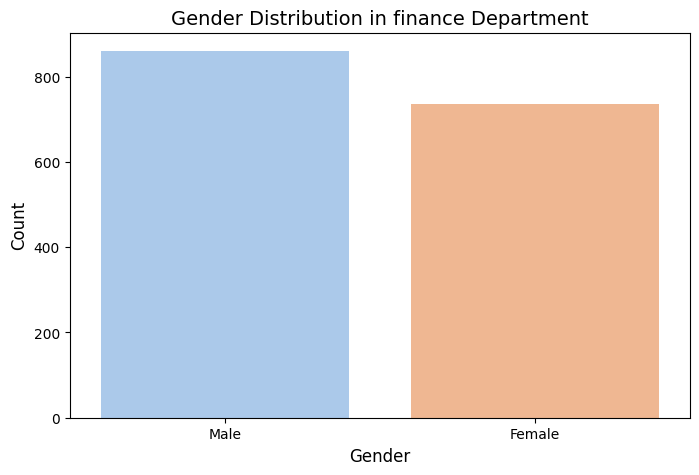

In [1054]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=finance_df, palette='pastel')
plt.title('Gender Distribution in finance Department', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [1055]:
# 2. Job_Title Distribution
finance_df['Job_Title'].value_counts()

,count
Job_Title,
Executive,555
Analyst,530
Manager,510


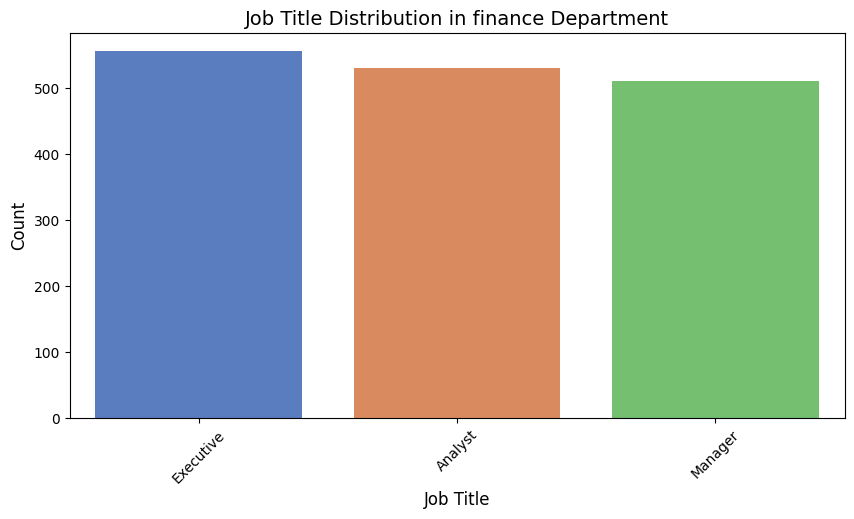

In [1056]:
plt.figure(figsize=(10,5))
sns.countplot(x='Job_Title', data=finance_df, palette='muted', order=finance_df['Job_Title'].value_counts().index)
plt.title('Job Title Distribution in finance Department', fontsize=14)
plt.xlabel('Job Title', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [1057]:
# 3.Education Level Distribution
finance_df['Education_Level'].value_counts()

,count
Education_Level,
Master,881
Bachelor,391
PhD,323


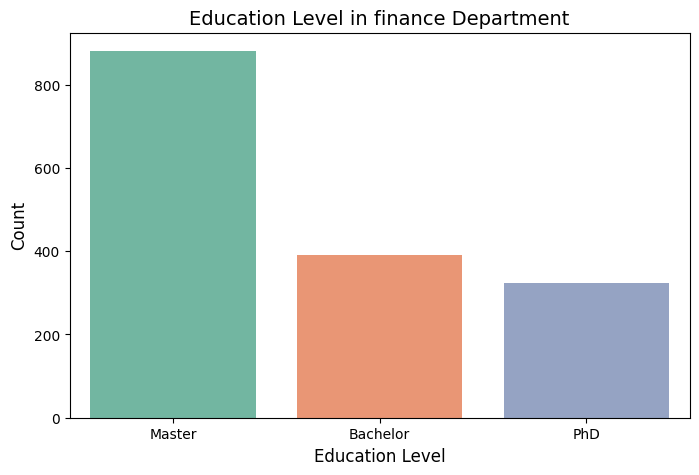

In [1058]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education_Level', data=finance_df, palette='Set2', order=finance_df['Education_Level'].value_counts().index)
plt.title('Education Level in finance Department', fontsize=14)
plt.xlabel('Education Level', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [1059]:
# 4.Location Distribution
finance_df['Location'].value_counts()

,count
Location,
Seattle,341
New York,337
Austin,324
Chicago,304
San Francisco,289


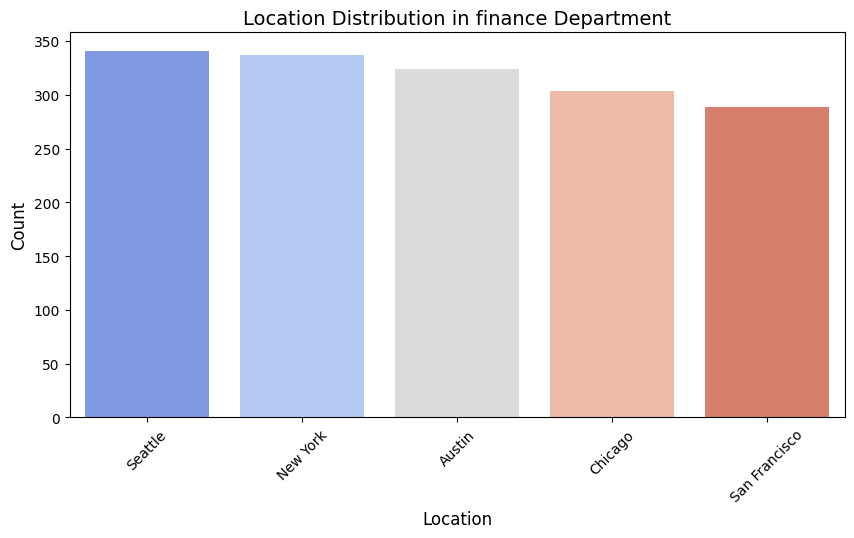

In [1060]:
plt.figure(figsize=(10,5))
sns.countplot(x='Location', data=finance_df, palette='coolwarm', order=finance_df['Location'].value_counts().index)
plt.title('Location Distribution in finance Department', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [1063]:
# Function to calculate outliers
def find_outliers(column):
    Q1 = finance_df[column].quantile(0.25)
    Q3 = finance_df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = finance_df[(finance_df[column] < lower_bound) | (finance_df[column] > upper_bound)]
    print(f"\n{column} Outliers:")
    print(outliers[column].values)


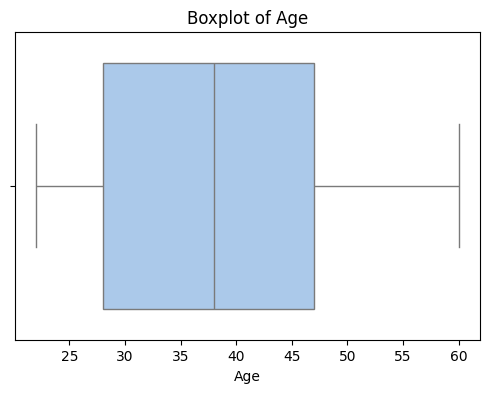


Age Outliers:
[]


In [1062]:
# Age
plt.figure(figsize=(6,4))
sns.boxplot(x=finance_df['Age'], palette='pastel')
plt.title('Boxplot of Age')
plt.show()

# Check outliers for Age columns
find_outliers('Age')




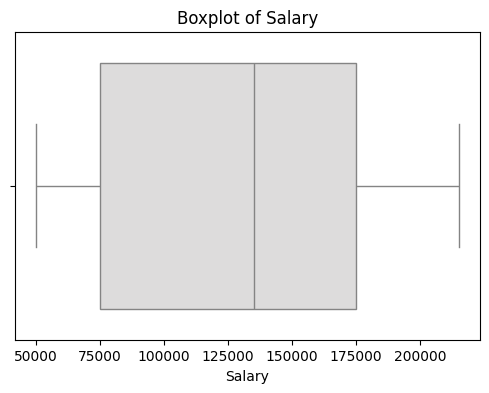


Salary Outliers:
[]


In [1064]:
# Salary
plt.figure(figsize=(6,4))
sns.boxplot(x=finance_df['Salary'], palette='coolwarm')
plt.title('Boxplot of Salary')
plt.show()

# Check outliers for Salary columns
find_outliers('Salary')

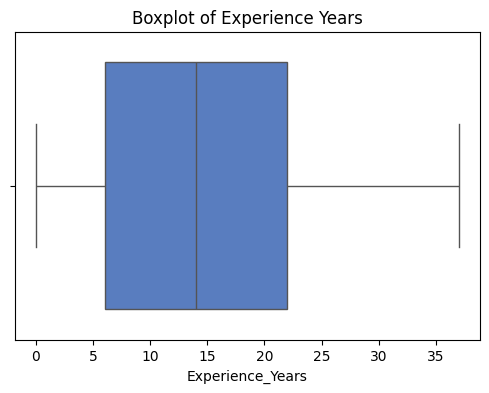


Experience_Years Outliers:
[]


In [1066]:

# Experience Years
plt.figure(figsize=(6,4))
sns.boxplot(x=finance_df['Experience_Years'], palette='muted')
plt.title('Boxplot of Experience Years')
plt.show()

# Check outliers for Experience_Years columns
find_outliers('Experience_Years')


In [1067]:
finance_df1=finance_df

In [1070]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Define categorical columns
cat_cols = ['Gender', 'Job_Title', 'Education_Level', 'Location']

# Step 2: Initialize LabelEncoder
le = LabelEncoder()

# Step 3: Apply LabelEncoder to each categorical column
for col in cat_cols:
    finance_df[col] = le.fit_transform(finance_df[col])

# Step 4: Check the encoded dataframe
finance_df.head()


,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,30,1,0,9,0,2,75000
1,35,1,2,8,2,2,125000
2,57,0,1,30,2,4,195000
3,49,1,1,26,1,3,190000
4,23,0,0,0,1,4,65000


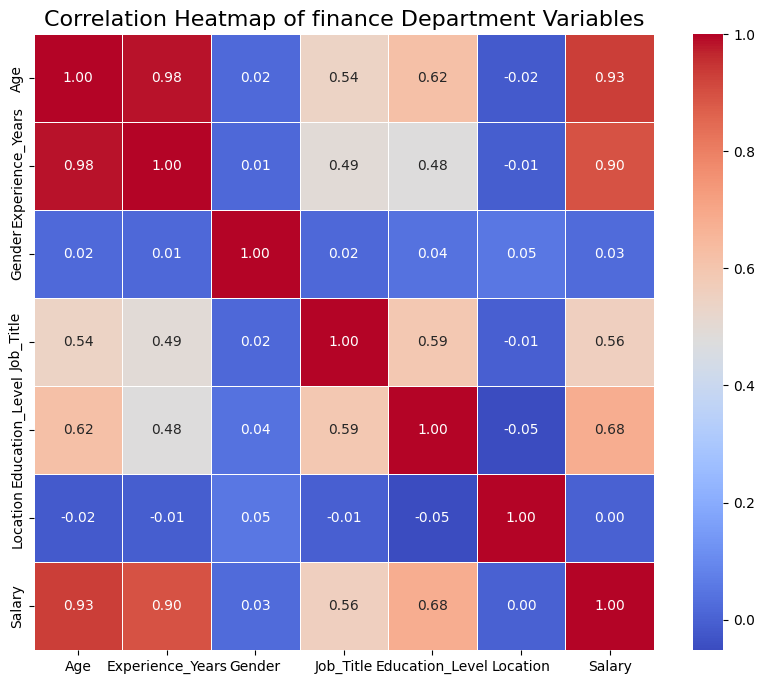

In [1071]:
# Select the 7 variables
cols = ['Age', 'Experience_Years', 'Gender', 'Job_Title', 'Education_Level', 'Location', 'Salary']
# Calculate correlation
corr = finance_df[cols].corr()
# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='white', cbar=True)
plt.title('Correlation Heatmap of finance Department Variables', fontsize=16)
plt.show()

In [1072]:
#corelation
corr

,Age,Experience_Years,Gender,Job_Title,Education_Level,Location,Salary
Age,1.000000,0.984330,0.018999,0.540646,0.618190,-0.017208,0.930577
Experience_Years,0.984330,1.000000,0.014486,0.492016,0.475300,-0.007277,0.896867
Gender,0.018999,0.014486,1.000000,0.015241,0.038927,0.054392,0.025406
Job_Title,0.540646,0.492016,0.015241,1.000000,0.592125,-0.006396,0.556398
Education_Level,0.618190,0.475300,0.038927,0.592125,1.000000,-0.052069,0.683204
Location,-0.017208,-0.007277,0.054392,-0.006396,-0.052069,1.000000,0.000984
Salary,0.930577,0.896867,0.025406,0.556398,0.683204,0.000984,1.000000


In [1073]:
# Calculate correlation
corr = finance_df[cols].corr()

# Select independent variables with correlation > 0.6 with Salary
finance_df_iv = corr['Salary'][abs(corr['Salary']) > 0.6].index.tolist()

# Remove 'salary' itself
finance_df_iv = [var for var in finance_df_iv if var != 'Salary']

print("Selected Independent Variables for Salary (correlation > 0.6):")
finance_df_iv

Selected Independent Variables for Salary (correlation > 0.6):


['Age', 'Experience_Years', 'Education_Level']

In [1074]:
#creating the model
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Independent and dependent variables
X = finance_df[['Age', 'Experience_Years', 'Education_Level']]
y = finance_df['Salary']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize independent variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models_finance = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=95),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'SVR': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
}

# Evaluate models
results = []

for name, model in models_finance.items():
    model.fit(X_train_scaled, y_train)
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    overall_acc = (train_r2 + test_r2) / 2

    results.append({
        'Model': name,
        'Training Accuracy (R2)': round(train_r2, 3),
        'Testing Accuracy (R2)': round(test_r2, 3),
        'Overall Accuracy': round(overall_acc, 3)
    })

# Display results
results_df = pd.DataFrame(results)
print(results_df)


               Model  Training Accuracy (R2)  Testing Accuracy (R2)  \
0  Linear Regression                   0.892                  0.890   
1   Ridge Regression                   0.892                  0.889   
2   Lasso Regression                   0.892                  0.890   
3      Decision Tree                   0.932                  0.927   
4      Random Forest                   0.932                  0.926   
5  Gradient Boosting                   0.931                  0.927   
6                SVR                   0.595                  0.598   

   Overall Accuracy  
0             0.891  
1             0.890  
2             0.891  
3             0.929  
4             0.929  
5             0.929  
6             0.596  


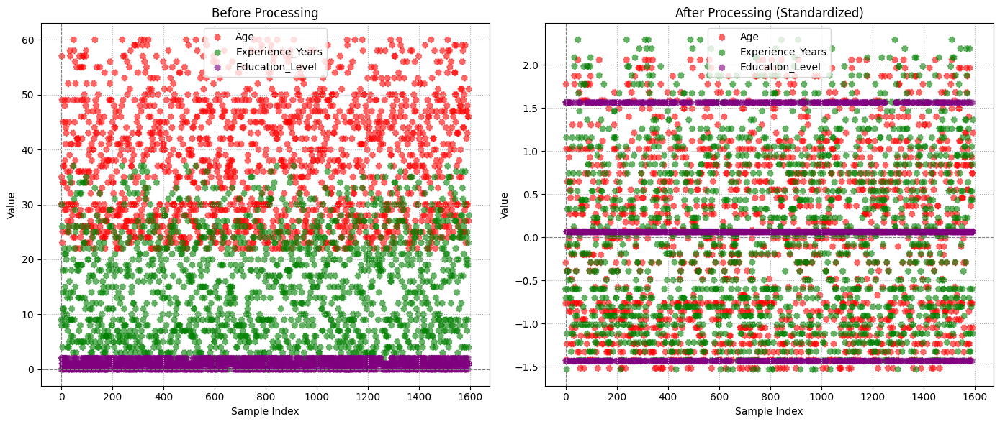

In [1075]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Features to plot (from the independent variables X)
features = ['Age', 'Experience_Years', 'Education_Level']
colors = ['red', 'green','purple']

plt.figure(figsize=(14,6))

# Plot 1: Before processing (using the original independent variables)
plt.subplot(1,2,1)
for feature, color in zip(features, colors):
    # Use the original independent variables X for the 'Before Processing' plot
    plt.scatter(x=range(len(X[feature])), y=X[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("Before Processing")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


# Plot 2: After processing (Standardized)
plt.subplot(1,2,2)
# Create a DataFrame from the standardized data (X_scaled) for easy plotting
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_scaled_df[feature])), y=X_scaled_df[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("After Processing (Standardized)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


plt.tight_layout()
plt.show()

In [1076]:
# Input your new data here
# Example: Age=21, Experience_Years=1,Education_Level=1
new_data = np.array([[30, 9, 0]])

# Standardize the input using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using trained Random Forest model
Finance = models_finance['Random Forest'].predict(new_data_scaled)

print(f"Predicted Salary: {Finance[0]:.2f}")

Predicted Salary: 75896.70


In [ ]:
finance_df.head(2)

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,30,1,0,9,0,2,75000
1,35,1,2,8,2,2,125000


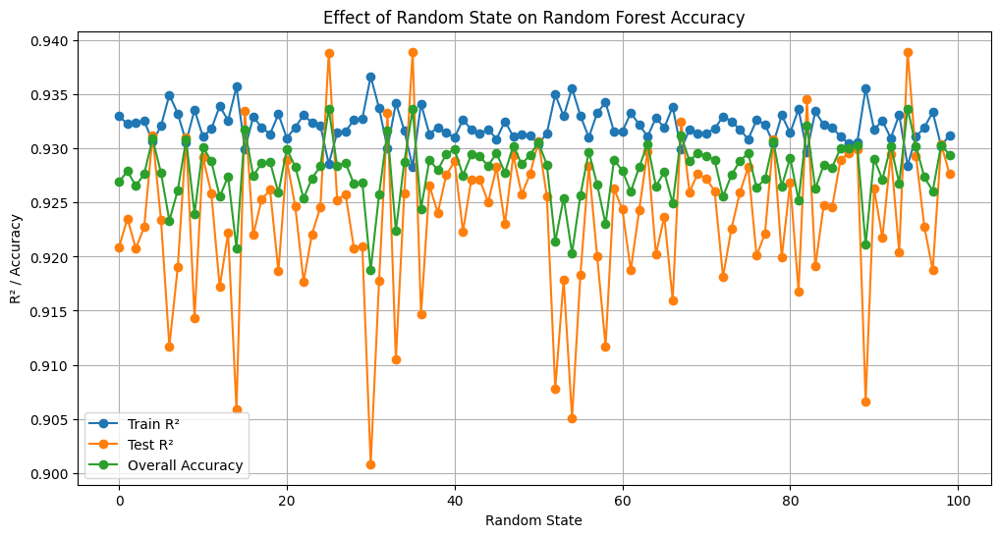

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Store results
random_states = list(range(0, 100))  # Random states 0 to 100
train_acc = []
test_acc = []
overall_acc = []

for rs in random_states:
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rs)

    model = RandomForestRegressor(n_estimators=100, random_state=rs)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2_val = r2_score(y_test, y_test_pred)
    overall_r2 = (train_r2 + test_r2_val) / 2

    train_acc.append(train_r2)
    test_acc.append(test_r2_val)
    overall_acc.append(overall_r2)

# Plot results
plt.figure(figsize=(12,6))
plt.plot(random_states, train_acc, marker='o', label='Train R²')
plt.plot(random_states, test_acc, marker='o', label='Test R²')
plt.plot(random_states, overall_acc, marker='o', label='Overall Accuracy')
plt.xlabel('Random State')
plt.ylabel('R² / Accuracy')
plt.title('Effect of Random State on Random Forest Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [1077]:
from ipywidgets import interact, widgets
from IPython.display import display

# Assuming scaler and trained Random Forest model already exist:
# scaler
# models['Random Forest']

# Dropdown for Education Level
edu_dropdown = widgets.Dropdown(
    options=['Bachelor', 'Master', 'PhD'],
    value='Bachelor',
    description='Education:',
    style={'description_width': 'initial'}
)
# Sliders for Age and Experience
age_slider = widgets.IntSlider(
    value=25,
    min=18,
    max=65,
    step=1,
    description='Age:',
    style={'description_width': 'initial'}
)
exp_slider = widgets.IntSlider(
    value=2,
    min=0,
    max=40,
    step=1,
    description='Experience (Years):',
    style={'description_width': 'initial'}
)
# Button for Prediction
predict_button = widgets.Button(
    description="Predict Salary",
    button_style='success',
    tooltip="Click to predict salary",
    icon='check'
)
output = widgets.Output()

# Encode Education
edu_map = {'Bachelor': 0, 'Master': 1, 'PhD': 2}

def on_predict_clicked(b):
    with output:
        output.clear_output()
        age = age_slider.value
        exp = exp_slider.value
        edu_encoded = edu_map[edu_dropdown.value]

        # Prepare and scale data
        new_data = np.array([[age, exp, edu_encoded]])
        new_data_scaled = scaler.transform(new_data)

        # Predict
        Finance = models_finance['Random Forest'].predict(new_data_scaled)[0]
        print(f" Predicted Salary: {Finance:.2f}")

predict_button.on_click(on_predict_clicked)

# Display widgets
display(age_slider, exp_slider, edu_dropdown, predict_button, output)


IntSlider(value=25, description='Age:', max=65, min=18, style=SliderStyle(description_width='initial'))

IntSlider(value=2, description='Experience (Years):', max=40, style=SliderStyle(description_width='initial'))

Dropdown(description='Education:', options=('Bachelor', 'Master', 'PhD'), style=DescriptionStyle(description_w…

Button(button_style='success', description='Predict Salary', icon='check', style=ButtonStyle(), tooltip='Click…

Output()

# **Justification for Choosing Random Forest in the Finance Department**


*   Higher Accuracy:  Random Forest has Training R² = 0.92 and Testing R² = 0.93, which is higher than Linear, Ridge, Lasso, and SVR. It shows strong predictive performance both in training and testing.









*   Better Generalization: The difference between training and testing accuracy is very small (0.92 vs 0.93), meaning the model does not overfit much.



*   Handles Non-Linearity:  Unlike Linear, Ridge, and Lasso (which assume linear relationships), Random Forest can capture complex non-linear patterns between features and Salary.
*   Balanced Performance: Compared to Decision Tree (which may overfit sometimes), Random Forest averages multiple trees, making it more stable and reliable.

# **Problem Statement HR:**


*   When we calculate the relationship between employee features and salary for the entire dataset, the results may not be accurate because each department has its own salary rules. HR employees also have their own salary structure, which is different from Finance, Sales, or Engineering. To get the correct insights, we should create a separate dataset for HR employees and study them independently.



# **Justification:**


*  In HR, salaries can be influenced by factors like education, experience, and other related features. If we keep HR employees mixed with other departments, these patterns may get hidden and give us the wrong picture. By analyzing only HR employees, we can better understand the exact factors that affect their salaries and build prediction models that are more accurate for the HR department.

In [ ]:
# Filter dataset for Sales department
hr_df = df[df["Department"] == "HR"]

In [ ]:
hr_df

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
4,25,Female,HR,Analyst,2,Master,Seattle,70000
14,59,Female,HR,Executive,32,PhD,Chicago,205000
17,44,Female,HR,Executive,21,Master,New York,175000
21,24,Female,HR,Analyst,3,Bachelor,Seattle,70000
27,53,Female,HR,Executive,26,PhD,Austin,190000
...,...,...,...,...,...,...,...,...
9967,26,Male,HR,Analyst,5,Bachelor,New York,70000
9972,39,Male,HR,Manager,16,Master,Seattle,130000
9976,25,Male,HR,Analyst,2,Master,Austin,75000
9983,23,Male,HR,Analyst,2,Bachelor,San Francisco,65000


In [ ]:
# Reset index
hr_df = hr_df.reset_index(drop=True)

In [ ]:
hr_df

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,25,Female,HR,Analyst,2,Master,Seattle,70000
1,59,Female,HR,Executive,32,PhD,Chicago,205000
2,44,Female,HR,Executive,21,Master,New York,175000
3,24,Female,HR,Analyst,3,Bachelor,Seattle,70000
4,53,Female,HR,Executive,26,PhD,Austin,190000
...,...,...,...,...,...,...,...,...
1655,26,Male,HR,Analyst,5,Bachelor,New York,70000
1656,39,Male,HR,Manager,16,Master,Seattle,130000
1657,25,Male,HR,Analyst,2,Master,Austin,75000
1658,23,Male,HR,Analyst,2,Bachelor,San Francisco,65000


In [ ]:
#droping Department colume
hr_df.drop("Department", axis=1, inplace=True)


In [ ]:
hr_df

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,25,Female,Analyst,2,Master,Seattle,70000
1,59,Female,Executive,32,PhD,Chicago,205000
2,44,Female,Executive,21,Master,New York,175000
3,24,Female,Analyst,3,Bachelor,Seattle,70000
4,53,Female,Executive,26,PhD,Austin,190000
...,...,...,...,...,...,...,...
1655,26,Male,Analyst,5,Bachelor,New York,70000
1656,39,Male,Manager,16,Master,Seattle,130000
1657,25,Male,Analyst,2,Master,Austin,75000
1658,23,Male,Analyst,2,Bachelor,San Francisco,65000


In [ ]:
# Check the shape of the dataframe
print("Shape of sales DF:", hr_df.shape)

Shape of sales DF: (1660, 7)


In [ ]:
# Check data types of each column
print("\nData Types:\n", hr_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [ ]:
# List categorical columns
categorical_cols = hr_df.select_dtypes(include='object').columns
print("\nCategorical Columns:", categorical_cols)

# Print unique values for each categorical column
for col in categorical_cols:
    print(f"\nUnique values in {col}: {hr_df[col].unique()}")


Categorical Columns: Index(['Gender', 'Job_Title', 'Education_Level', 'Location'], dtype='object')

Unique values in Gender: ['Female' 'Male']

Unique values in Job_Title: ['Analyst' 'Executive' 'Manager']

Unique values in Education_Level: ['Master' 'PhD' 'Bachelor']

Unique values in Location: ['Seattle' 'Chicago' 'New York' 'Austin' 'San Francisco']


In [ ]:
hr_df.ndim

2

In [ ]:
hr_df.describe()

,Age,Experience_Years,Salary
count,1660.000000,1660.000000,1660.000000
mean,37.405422,14.123494,126400.602410
std,10.631936,9.599882,48236.961556
min,22.000000,0.000000,50000.000000
25%,28.000000,6.000000,70000.000000
50%,37.000000,13.000000,130000.000000
75%,46.000000,22.000000,170000.000000
max,60.000000,37.000000,215000.000000


In [ ]:
# 1. Gender Distribution
hr_df['Gender'].value_counts()

,count
Gender,
Male,835
Female,825


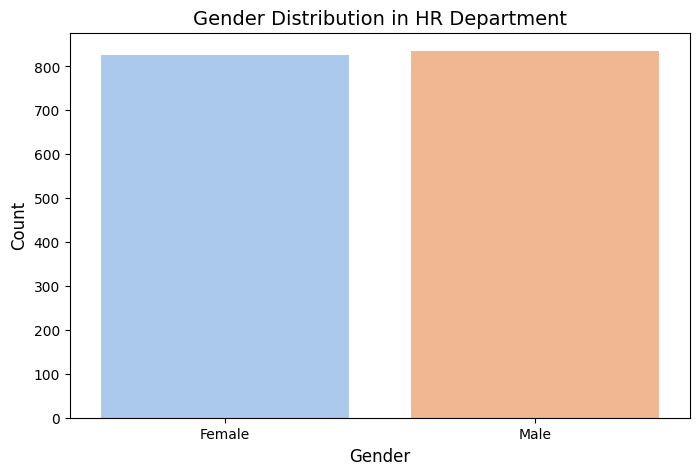

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=hr_df, palette='pastel')
plt.title('Gender Distribution in HR Department', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [ ]:
# 2. Job_Title Distribution
hr_df['Job_Title'].value_counts()

,count
Job_Title,
Analyst,595
Manager,546
Executive,519


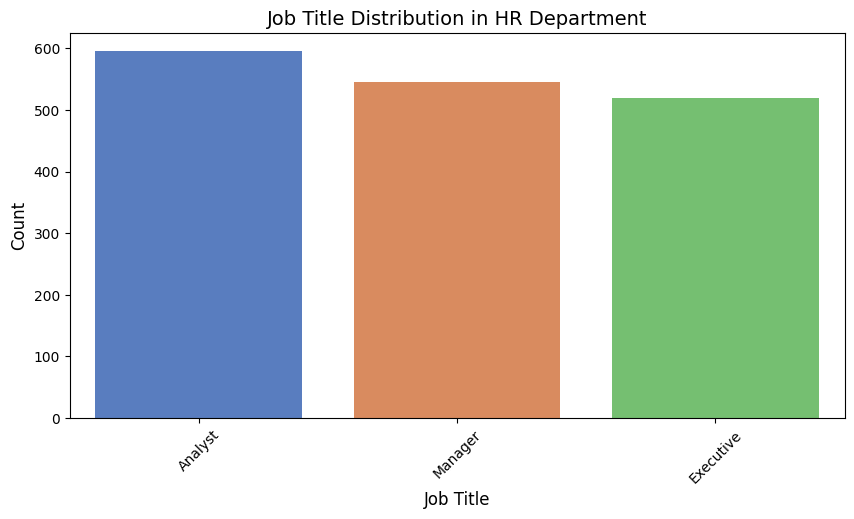

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Job_Title', data=hr_df, palette='muted', order=hr_df['Job_Title'].value_counts().index)
plt.title('Job Title Distribution in HR Department', fontsize=14)
plt.xlabel('Job Title', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# 3.Education Level Distribution
hr_df['Education_Level'].value_counts()

,count
Education_Level,
Master,868
Bachelor,450
PhD,342


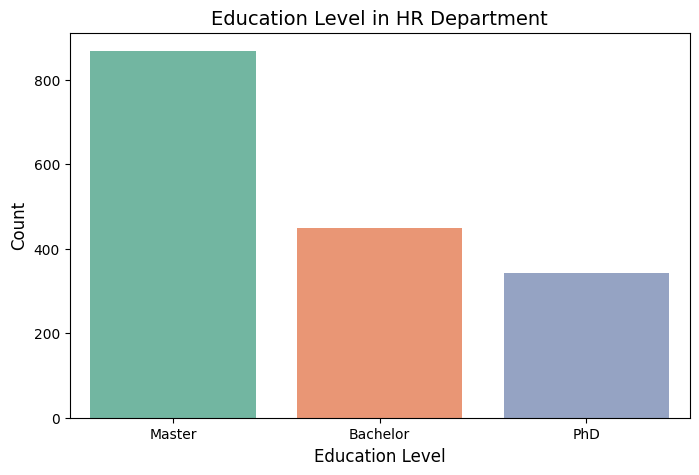

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education_Level', data=hr_df, palette='Set2', order=hr_df['Education_Level'].value_counts().index)
plt.title('Education Level in HR Department', fontsize=14)
plt.xlabel('Education Level', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [ ]:
# 4.Location Distribution
hr_df['Location'].value_counts()

,count
Location,
Seattle,342
New York,342
San Francisco,333
Chicago,322
Austin,321


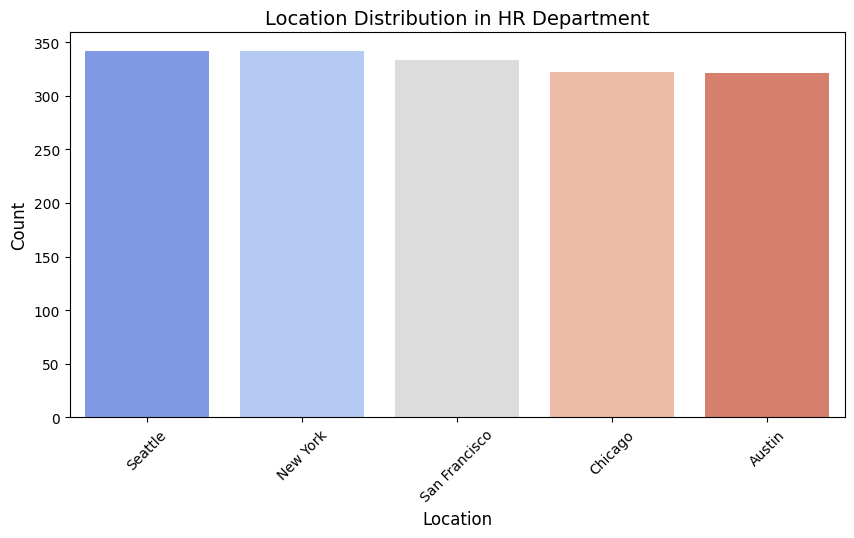

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Location', data=hr_df, palette='coolwarm', order=hr_df['Location'].value_counts().index)
plt.title('Location Distribution in HR Department', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Function to calculate outliers
def find_outliers(column):
    Q1 = hr_df[column].quantile(0.25)
    Q3 = hr_df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = hr_df[(hr_df[column] < lower_bound) | (hr_df[column] > upper_bound)]
    print(f"\n{column} Outliers:")
    print(outliers[column].values)


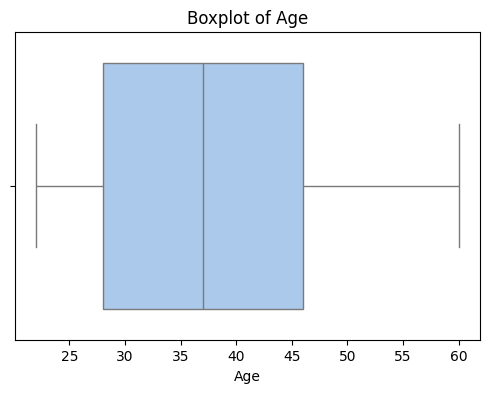


Age Outliers:
[]


In [ ]:
# Age
plt.figure(figsize=(6,4))
sns.boxplot(x=hr_df['Age'], palette='pastel')
plt.title('Boxplot of Age')
plt.show()

# Check outliers for Age columns
find_outliers('Age')




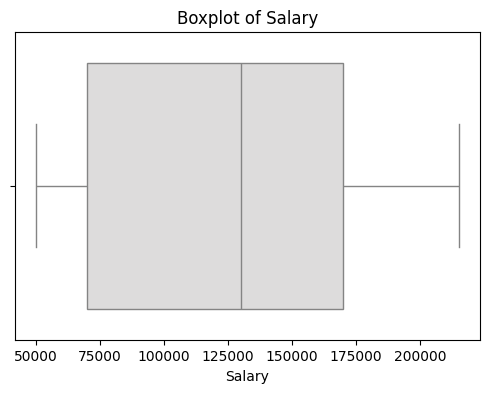


Salary Outliers:
[]


In [ ]:
# Salary
plt.figure(figsize=(6,4))
sns.boxplot(x=hr_df['Salary'], palette='coolwarm')
plt.title('Boxplot of Salary')
plt.show()

# Check outliers for Salary columns
find_outliers('Salary')

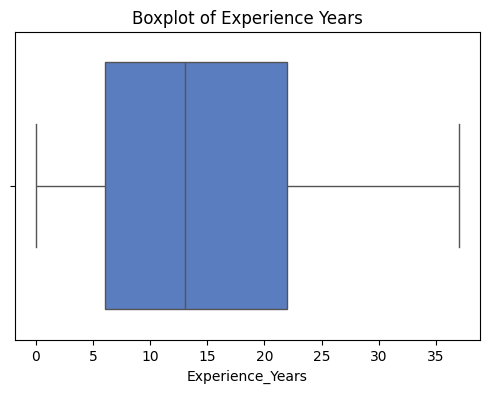


Experience_Years Outliers:
[]


In [ ]:

# Experience Years
plt.figure(figsize=(6,4))
sns.boxplot(x=hr_df['Experience_Years'], palette='muted')
plt.title('Boxplot of Experience Years')
plt.show()

# Check outliers for Experience_Years columns
find_outliers('Experience_Years')


In [ ]:
hr_df1=hr_df

In [1078]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Define categorical columns
cat_cols = ['Gender', 'Job_Title', 'Education_Level', 'Location']

# Step 2: Initialize LabelEncoder
le = LabelEncoder()

# Step 3: Apply LabelEncoder to each categorical column
for col in cat_cols:
    hr_df[col] = le.fit_transform(hr_df[col])

# Step 4: Check the encoded dataframe
hr_df.head()


,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,25,0,0,2,1,4,70000
1,59,0,1,32,2,1,205000
2,44,0,1,21,1,2,175000
3,24,0,0,3,0,4,70000
4,53,0,1,26,2,0,190000


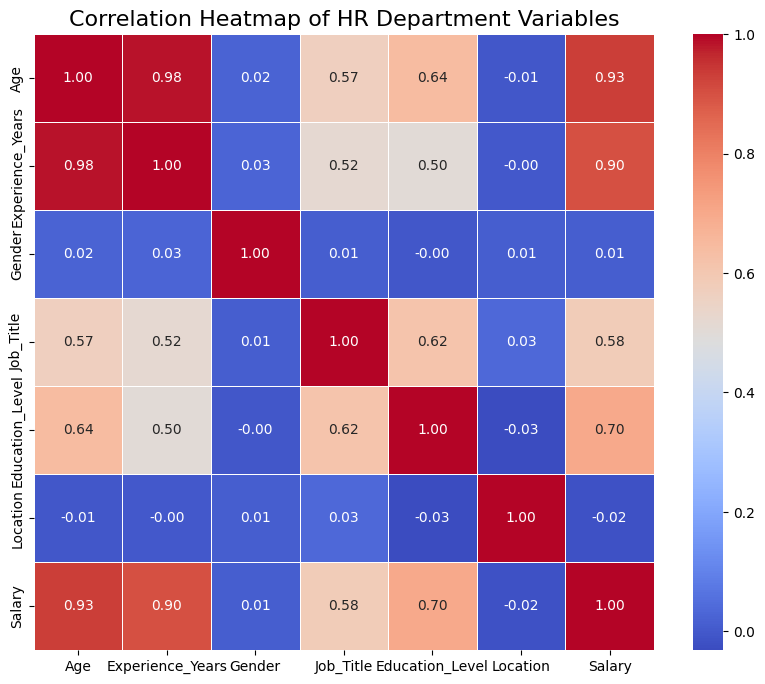

In [1079]:
# Select the 7 variables
cols = ['Age', 'Experience_Years', 'Gender', 'Job_Title', 'Education_Level', 'Location', 'Salary']
# Calculate correlation
corr = hr_df[cols].corr()
# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='white', cbar=True)
plt.title('Correlation Heatmap of HR Department Variables', fontsize=16)
plt.show()

In [1081]:
#corelation
corr

,Age,Experience_Years,Gender,Job_Title,Education_Level,Location,Salary
Age,1.000000,0.984134,0.023405,0.566670,0.643936,-0.006647,0.933835
Experience_Years,0.984134,1.000000,0.027354,0.517146,0.503358,-0.000113,0.900930
Gender,0.023405,0.027354,1.000000,0.009667,-0.004686,0.011391,0.010506
Job_Title,0.566670,0.517146,0.009667,1.000000,0.616217,0.033268,0.584459
Education_Level,0.643936,0.503358,-0.004686,0.616217,1.000000,-0.031384,0.700974
Location,-0.006647,-0.000113,0.011391,0.033268,-0.031384,1.000000,-0.015929
Salary,0.933835,0.900930,0.010506,0.584459,0.700974,-0.015929,1.000000


In [1082]:
# Calculate correlation
corr = hr_df[cols].corr()

# Select independent variables with correlation > 0.7 with Salary
hr_df_iv = corr['Salary'][abs(corr['Salary']) > 0.7].index.tolist()

# Remove 'Salary' itself
hr_df_iv = [var for var in hr_df_iv if var != 'Salary']

print("Selected Independent Variables for Salary (correlation > 0.7):")
hr_df_iv

Selected Independent Variables for Salary (correlation > 0.7):


['Age', 'Experience_Years', 'Education_Level']

In [1083]:
#creating the model
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Independent and dependent variables
X = hr_df[['Age', 'Experience_Years', 'Education_Level']]
y = hr_df['Salary']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize independent variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models_hr = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'SVR': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
}

# Evaluate models
results = []

for name, model in models_hr.items():
    model.fit(X_train_scaled, y_train)
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    overall_acc = (train_r2 + test_r2) / 2

    results.append({
        'Model': name,
        'Training Accuracy (R2)': round(train_r2, 3),
        'Testing Accuracy (R2)': round(test_r2, 3),
        'Overall Accuracy': round(overall_acc, 3)
    })

# Display results
results_df = pd.DataFrame(results)
print(results_df)


               Model  Training Accuracy (R2)  Testing Accuracy (R2)  \
0  Linear Regression                   0.895                  0.898   
1   Ridge Regression                   0.894                  0.897   
2   Lasso Regression                   0.895                  0.898   
3      Decision Tree                   0.933                  0.933   
4      Random Forest                   0.933                  0.933   
5  Gradient Boosting                   0.933                  0.933   
6                SVR                   0.614                  0.625   

   Overall Accuracy  
0             0.897  
1             0.896  
2             0.897  
3             0.933  
4             0.933  
5             0.933  
6             0.620  


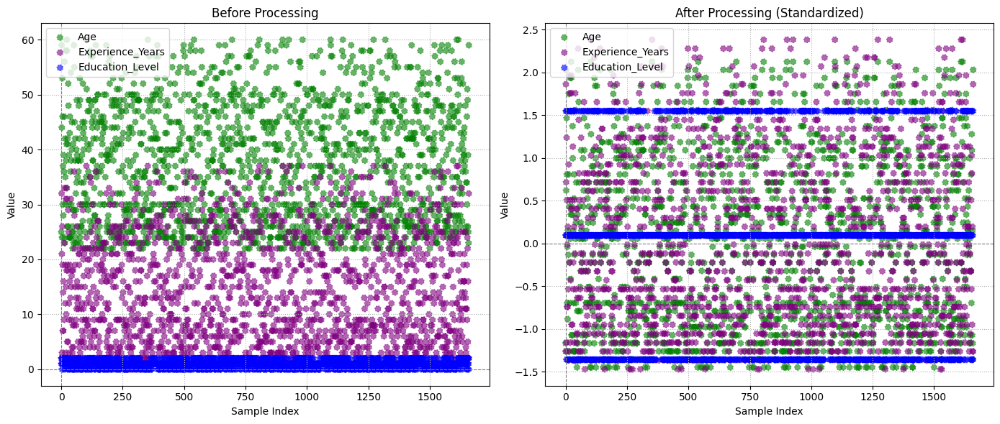

In [1084]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Features to plot (from the independent variables X)
features = ['Age', 'Experience_Years', 'Education_Level']
colors = [ 'green','purple', 'blue']

plt.figure(figsize=(14,6))

# Plot 1: Before processing (using the original independent variables)
plt.subplot(1,2,1)
for feature, color in zip(features, colors):
    # Use the original independent variables X for the 'Before Processing' plot
    plt.scatter(x=range(len(X[feature])), y=X[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("Before Processing")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


# Plot 2: After processing (Standardized)
plt.subplot(1,2,2)
# Create a DataFrame from the standardized data (X_scaled) for easy plotting
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_scaled_df[feature])), y=X_scaled_df[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("After Processing (Standardized)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


plt.tight_layout()
plt.show()

In [ ]:
hr_df.head(2)

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,25,0,0,2,1,4,70000
1,59,0,1,32,2,1,205000


In [1085]:
# Input your new data here
# Example: Age=21, Experience_Years=1, Education_Level=1
new_data = np.array([[25, 2, 1]])

# Standardize the input using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using trained Random Forest model
HR = models_hr['Random Forest'].predict(new_data_scaled)

print(f"Predicted Salary: {HR[0]:.2f}")

Predicted Salary: 68043.06


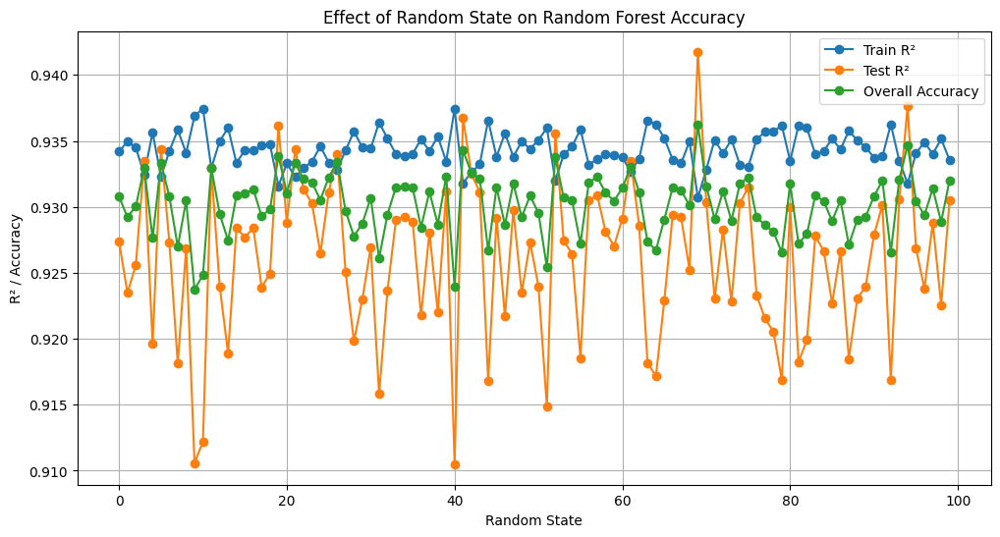

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Store results
random_states = list(range(0, 100))  # Random states 0 to 100
train_acc = []
test_acc = []
overall_acc = []

for rs in random_states:
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rs)

    model = RandomForestRegressor(n_estimators=100, random_state=rs)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2_val = r2_score(y_test, y_test_pred)
    overall_r2 = (train_r2 + test_r2_val) / 2

    train_acc.append(train_r2)
    test_acc.append(test_r2_val)
    overall_acc.append(overall_r2)

# Plot results
plt.figure(figsize=(12,6))
plt.plot(random_states, train_acc, marker='o', label='Train R²')
plt.plot(random_states, test_acc, marker='o', label='Test R²')
plt.plot(random_states, overall_acc, marker='o', label='Overall Accuracy')
plt.xlabel('Random State')
plt.ylabel('R² / Accuracy')
plt.title('Effect of Random State on Random Forest Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [1086]:
from ipywidgets import interact, widgets
from IPython.display import display

# Assuming scaler and trained Random Forest model already exist:
# scaler
# models['Random Forest']

# Dropdown for Education Level
edu_dropdown = widgets.Dropdown(
    options=['Bachelor', 'Master', 'PhD'],
    value='Bachelor',
    description='Education:',
    style={'description_width': 'initial'}
)

# Sliders for Age and Experience
age_slider = widgets.IntSlider(
    value=25,
    min=18,
    max=65,
    step=1,
    description='Age:',
    style={'description_width': 'initial'}
)
exp_slider = widgets.IntSlider(
    value=2,
    min=0,
    max=40,
    step=1,
    description='Experience (Years):',
    style={'description_width': 'initial'}
)
# Button for Prediction
predict_button = widgets.Button(
    description="Predict Salary",
    button_style='success',
    tooltip="Click to predict salary",
    icon='check'
)
output = widgets.Output()

# Encode Education
edu_map = {'Bachelor': 0, 'Master': 1, 'PhD': 2}

def HR_predict_clicked(b):
    with output:
        output.clear_output()
        age = age_slider.value
        exp = exp_slider.value
        edu_encoded = edu_map[edu_dropdown.value]


        # Prepare and scale data
        HR_data = np.array([[age, exp, edu_encoded]])
        HR_data_scaled = scaler.transform(HR_data)

        # Predict
        HR = models_hr['Random Forest'].predict(HR_data_scaled)[0]
        print(f" Predicted Salary: {HR:.2f}")

predict_button.on_click(HR_predict_clicked)

# Display widgets
display(age_slider, exp_slider, edu_dropdown, predict_button, output)


IntSlider(value=25, description='Age:', max=65, min=18, style=SliderStyle(description_width='initial'))

IntSlider(value=2, description='Experience (Years):', max=40, style=SliderStyle(description_width='initial'))

Dropdown(description='Education:', options=('Bachelor', 'Master', 'PhD'), style=DescriptionStyle(description_w…

Button(button_style='success', description='Predict Salary', icon='check', style=ButtonStyle(), tooltip='Click…

Output()

# **Justification for Choosing Random Forest in the HR Department**


*   Higher Accuracy:  Random Forest has Training R² = 0.93 and Testing R² = 0.93, which is higher than Linear, Ridge, Lasso, and SVR. It shows strong predictive performance both in training and testing.









*   Better Generalization: The no difference between training and testing accuracy (0.93 vs 0.93), meaning the model does not overfit much.



*   Handles Non-Linearity:  Unlike Linear, Ridge, and Lasso (which assume linear relationships), Random Forest can capture complex non-linear patterns between features and Salary.
*   Balanced Performance: Compared to Decision Tree (which may overfit sometimes), Random Forest averages multiple trees, making it more stable and reliable.

# **Problem Statement Marketing:**


*  Analyzing all employees together can hide the true factors that affect salaries because each department has different pay patterns. Marketing employees have their own salary structure, which is different from HR, Sales, or Engineering. To get meaningful insights, we should separate Marketing employees into their own dataset and analyze them individually.



# **Justification:**


*  In Marketing, salaries are influenced by factors such as experience, education, and other relevant features. If we mix Marketing employees with other departments, the real patterns may get lost and the analysis will be less accurate. By focusing only on Marketing employees, we can better understand which factors affect their salaries and build models that are specific and accurate for this department.

In [1087]:
# Filter dataset for Marketing department
marketing_df = df[df["Department"] == "Marketing"]

In [ ]:
marketing_df

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
6,23,Female,Marketing,Analyst,2,Bachelor,San Francisco,60000
7,47,Female,Marketing,Manager,24,Master,San Francisco,145000
8,43,Male,Marketing,Manager,16,PhD,San Francisco,135000
9,23,Female,Marketing,Analyst,0,Master,San Francisco,70000
19,48,Male,Marketing,Manager,21,PhD,Chicago,150000
...,...,...,...,...,...,...,...,...
9950,44,Female,Marketing,Manager,21,Master,Austin,150000
9957,43,Female,Marketing,Manager,16,PhD,Chicago,140000
9959,25,Female,Marketing,Analyst,4,Bachelor,New York,70000
9969,29,Female,Marketing,Analyst,8,Bachelor,New York,80000


In [1088]:
# Reset index
marketing_df = marketing_df.reset_index(drop=True)

In [ ]:
marketing_df

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,23,Female,Marketing,Analyst,2,Bachelor,San Francisco,60000
1,47,Female,Marketing,Manager,24,Master,San Francisco,145000
2,43,Male,Marketing,Manager,16,PhD,San Francisco,135000
3,23,Female,Marketing,Analyst,0,Master,San Francisco,70000
4,48,Male,Marketing,Manager,21,PhD,Chicago,150000
...,...,...,...,...,...,...,...,...
1664,44,Female,Marketing,Manager,21,Master,Austin,150000
1665,43,Female,Marketing,Manager,16,PhD,Chicago,140000
1666,25,Female,Marketing,Analyst,4,Bachelor,New York,70000
1667,29,Female,Marketing,Analyst,8,Bachelor,New York,80000


In [1089]:
#droping Department colume
marketing_df.drop("Department", axis=1, inplace=True)


In [ ]:
marketing_df

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,23,Female,Analyst,2,Bachelor,San Francisco,60000
1,47,Female,Manager,24,Master,San Francisco,145000
2,43,Male,Manager,16,PhD,San Francisco,135000
3,23,Female,Analyst,0,Master,San Francisco,70000
4,48,Male,Manager,21,PhD,Chicago,150000
...,...,...,...,...,...,...,...
1664,44,Female,Manager,21,Master,Austin,150000
1665,43,Female,Manager,16,PhD,Chicago,140000
1666,25,Female,Analyst,4,Bachelor,New York,70000
1667,29,Female,Analyst,8,Bachelor,New York,80000


In [ ]:
# Check the shape of the dataframe
print("Shape of sales DF:", marketing_df.shape)

Shape of sales DF: (1669, 7)


In [ ]:
# Check data types of each column
print("\nData Types:\n", marketing_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [ ]:
# List categorical columns
categorical_cols = marketing_df.select_dtypes(include='object').columns
print("\nCategorical Columns:", categorical_cols)

# Print unique values for each categorical column
for col in categorical_cols:
    print(f"\nUnique values in {col}: {marketing_df[col].unique()}")


Categorical Columns: Index(['Gender', 'Job_Title', 'Education_Level', 'Location'], dtype='object')

Unique values in Gender: ['Female' 'Male']

Unique values in Job_Title: ['Analyst' 'Manager']

Unique values in Education_Level: ['Bachelor' 'Master' 'PhD']

Unique values in Location: ['San Francisco' 'Chicago' 'New York' 'Seattle' 'Austin']


In [ ]:
marketing_df.ndim

2

In [ ]:
marketing_df.describe()

,Age,Experience_Years,Salary
count,1669.000000,1669.00000,1669.000000
mean,32.979029,10.24985,101734.571600
std,8.382645,7.50910,34145.560673
min,22.000000,0.00000,50000.000000
25%,26.000000,4.00000,70000.000000
50%,30.000000,8.00000,80000.000000
75%,40.000000,16.00000,135000.000000
max,50.000000,27.00000,160000.000000


In [ ]:
# 1. Gender Distribution
marketing_df['Gender'].value_counts()

,count
Gender,
Male,838
Female,831


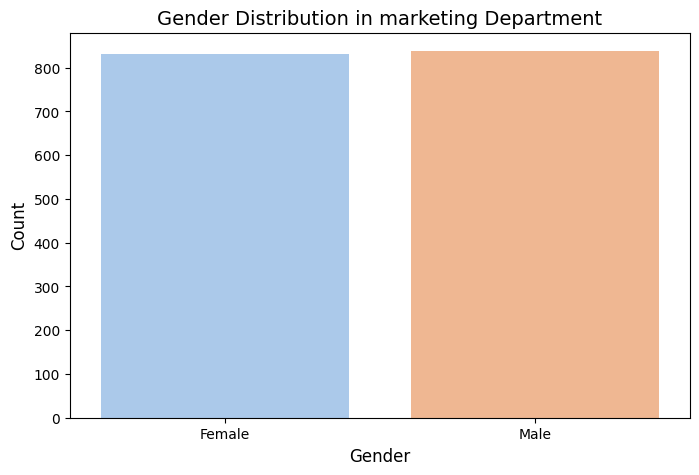

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=marketing_df, palette='pastel')
plt.title('Gender Distribution in marketing Department', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [ ]:
# 2. Job_Title Distribution
marketing_df['Job_Title'].value_counts()

,count
Job_Title,
Analyst,852
Manager,817


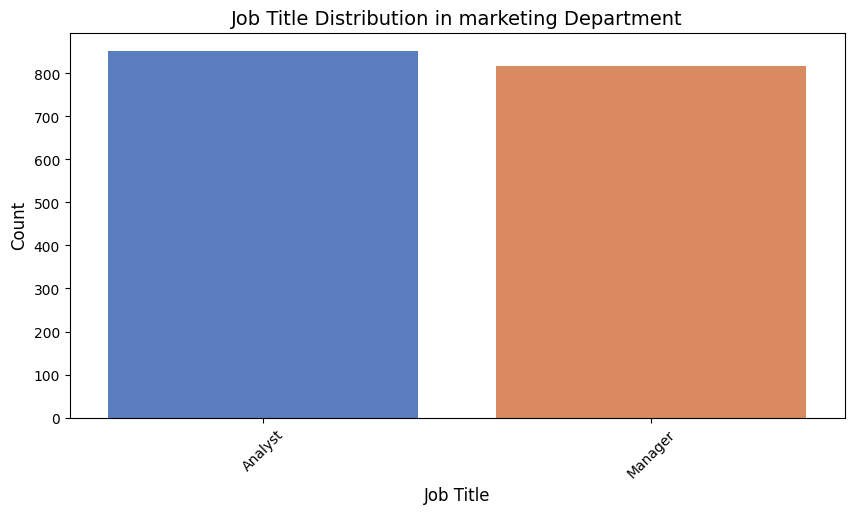

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Job_Title', data=marketing_df, palette='muted', order=marketing_df['Job_Title'].value_counts().index)
plt.title('Job Title Distribution in marketing Department', fontsize=14)
plt.xlabel('Job Title', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# 3.Education Level Distribution
marketing_df['Education_Level'].value_counts()

,count
Education_Level,
Master,837
Bachelor,630
PhD,202


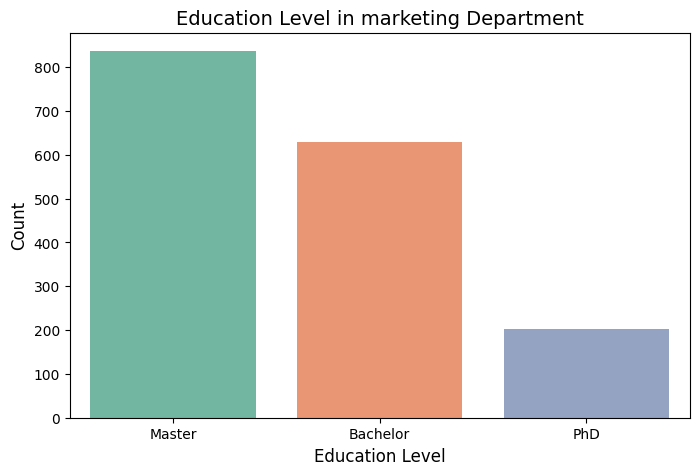

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education_Level', data=marketing_df, palette='Set2', order=marketing_df['Education_Level'].value_counts().index)
plt.title('Education Level in marketing Department', fontsize=14)
plt.xlabel('Education Level', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [ ]:
# 4.Location Distribution
marketing_df['Location'].value_counts()

,count
Location,
New York,344
Chicago,343
San Francisco,336
Austin,333
Seattle,313


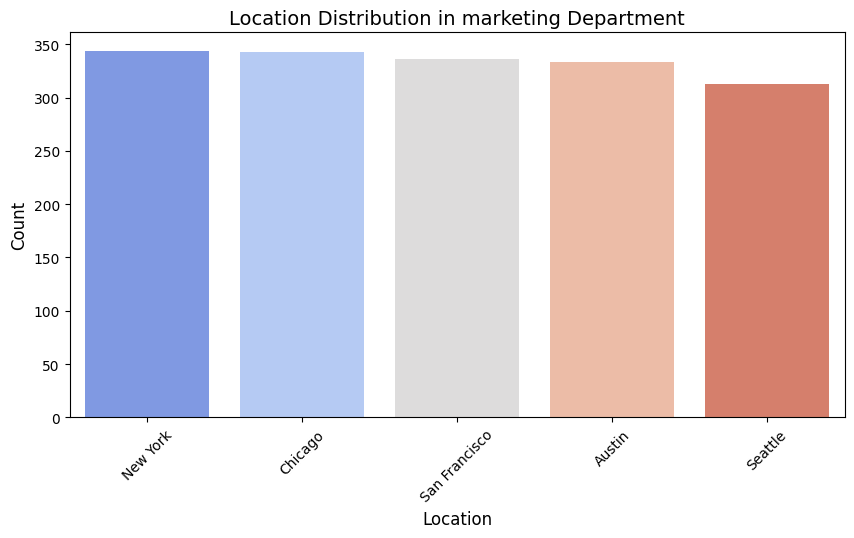

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Location', data=marketing_df, palette='coolwarm', order=marketing_df['Location'].value_counts().index)
plt.title('Location Distribution in marketing Department', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Function to calculate outliers
def find_outliers(column):
    Q1 = marketing_df[column].quantile(0.25)
    Q3 = marketing_df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = marketing_df[(marketing_df[column] < lower_bound) | (marketing_df[column] > upper_bound)]
    print(f"\n{column} Outliers:")
    print(outliers[column].values)


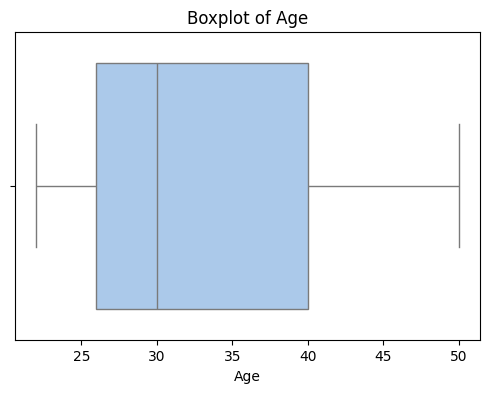


Age Outliers:
[]


In [ ]:
# Age
plt.figure(figsize=(6,4))
sns.boxplot(x=marketing_df['Age'], palette='pastel')
plt.title('Boxplot of Age')
plt.show()

# Check outliers for Age columns
find_outliers('Age')




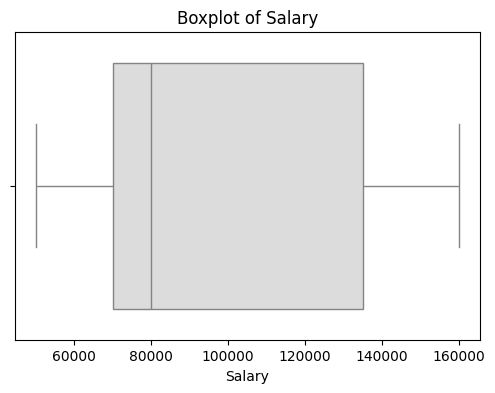


Salary Outliers:
[]


In [ ]:
# Salary
plt.figure(figsize=(6,4))
sns.boxplot(x=marketing_df['Salary'], palette='coolwarm')
plt.title('Boxplot of Salary')
plt.show()

# Check outliers for Salary columns
find_outliers('Salary')

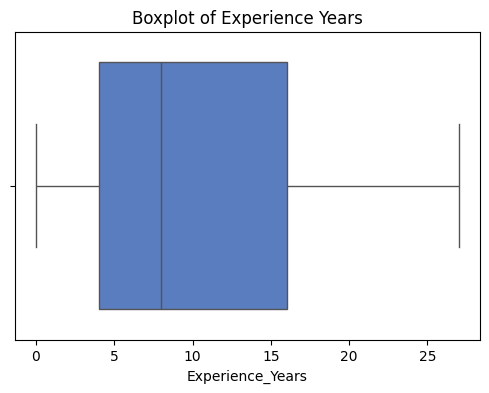


Experience_Years Outliers:
[]


In [ ]:

# Experience Years
plt.figure(figsize=(6,4))
sns.boxplot(x=marketing_df['Experience_Years'], palette='muted')
plt.title('Boxplot of Experience Years')
plt.show()

# Check outliers for Experience_Years columns
find_outliers('Experience_Years')


In [ ]:
marketing_df1=marketing_df

In [1090]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Define categorical columns
cat_cols = ['Gender', 'Job_Title', 'Education_Level', 'Location']

# Step 2: Initialize LabelEncoder
le = LabelEncoder()

# Step 3: Apply LabelEncoder to each categorical column
for col in cat_cols:
    marketing_df[col] = le.fit_transform(marketing_df[col])

# Step 4: Check the encoded dataframe
marketing_df.head()


,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,23,0,0,2,0,3,60000
1,47,0,1,24,1,3,145000
2,43,1,1,16,2,3,135000
3,23,0,0,0,1,3,70000
4,48,1,1,21,2,1,150000


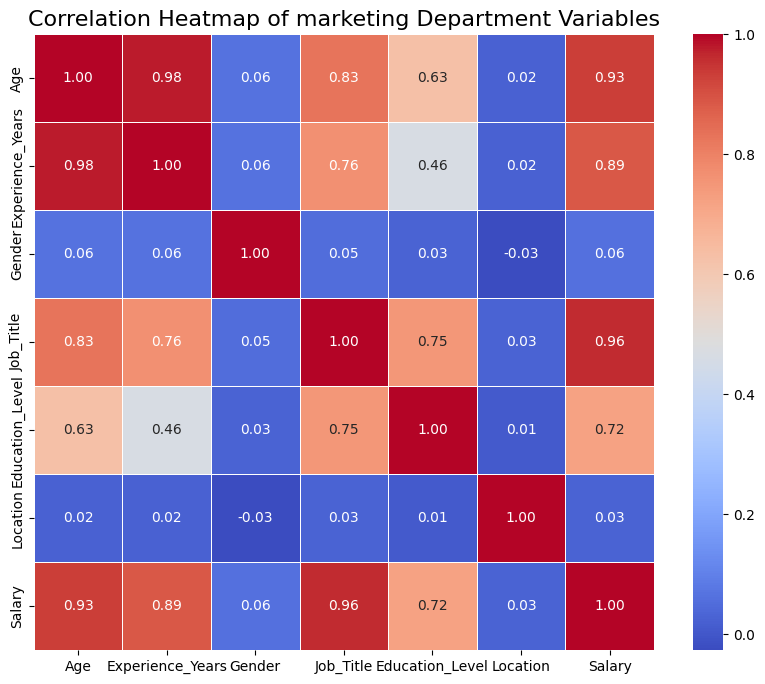

In [1091]:
# Select the 7 variables
cols = ['Age', 'Experience_Years', 'Gender', 'Job_Title', 'Education_Level', 'Location', 'Salary']
# Calculate correlation
corr = marketing_df[cols].corr()
# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='white', cbar=True)
plt.title('Correlation Heatmap of marketing Department Variables', fontsize=16)
plt.show()

In [1092]:
#corelation
corr

,Age,Experience_Years,Gender,Job_Title,Education_Level,Location,Salary
Age,1.000000,0.979252,0.062429,0.831435,0.627672,0.021788,0.933328
Experience_Years,0.979252,1.000000,0.063474,0.763820,0.463841,0.024022,0.885983
Gender,0.062429,0.063474,1.000000,0.052227,0.027138,-0.026918,0.060256
Job_Title,0.831435,0.763820,0.052227,1.000000,0.749788,0.029157,0.963068
Education_Level,0.627672,0.463841,0.027138,0.749788,1.000000,0.008436,0.719290
Location,0.021788,0.024022,-0.026918,0.029157,0.008436,1.000000,0.028395
Salary,0.933328,0.885983,0.060256,0.963068,0.719290,0.028395,1.000000


In [1093]:
# Calculate correlation
corr = marketing_df[cols].corr()

# Select independent variables with correlation > 0.7 with Salary
marketing_df_iv = corr['Salary'][abs(corr['Salary']) > 0.7].index.tolist()

# Remove 'Salary' itself
marketing_df_iv = [var for var in marketing_df_iv if var != 'Salary']

print("Selected Independent Variables for Salary (correlation > 0.7):")
marketing_df_iv

Selected Independent Variables for Salary (correlation > 0.7):


['Age', 'Experience_Years', 'Job_Title', 'Education_Level']

In [1094]:
#creating the model
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Independent and dependent variables
X = marketing_df[['Age', 'Experience_Years', 'Job_Title','Education_Level']]
y = marketing_df['Salary']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize independent variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models_marketing = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'SVR': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
}

# Evaluate models
results = []

for name, model in models_marketing.items():
    model.fit(X_train_scaled, y_train)
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    overall_acc = (train_r2 + test_r2) / 2

    results.append({
        'Model': name,
        'Training Accuracy (R2)': round(train_r2, 3),
        'Testing Accuracy (R2)': round(test_r2, 3),
        'Overall Accuracy': round(overall_acc, 3)
    })

# Display results
results_df = pd.DataFrame(results)
print(results_df)


               Model  Training Accuracy (R2)  Testing Accuracy (R2)  \
0  Linear Regression                   0.985                  0.984   
1   Ridge Regression                   0.985                  0.984   
2   Lasso Regression                   0.985                  0.984   
3      Decision Tree                   0.986                  0.984   
4      Random Forest                   0.986                  0.984   
5  Gradient Boosting                   0.986                  0.985   
6                SVR                   0.937                  0.936   

   Overall Accuracy  
0             0.985  
1             0.985  
2             0.985  
3             0.985  
4             0.985  
5             0.985  
6             0.937  


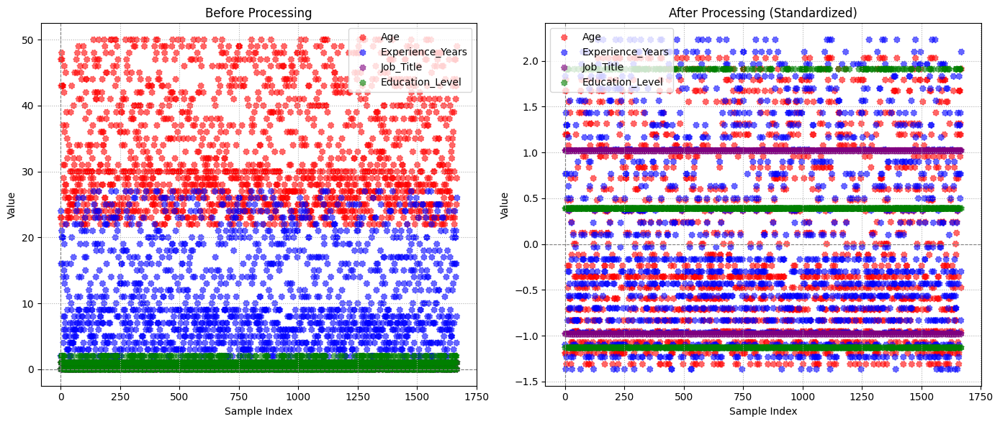

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Features to plot (from the independent variables X)
features = ['Age', 'Experience_Years', 'Job_Title', 'Education_Level']
colors = ['red', 'blue','purple', 'green']

plt.figure(figsize=(14,6))

# Plot 1: Before processing (using the original independent variables)
plt.subplot(1,2,1)
for feature, color in zip(features, colors):
    # Use the original independent variables X for the 'Before Processing' plot
    plt.scatter(x=range(len(X[feature])), y=X[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("Before Processing")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


# Plot 2: After processing (Standardized)
plt.subplot(1,2,2)
# Create a DataFrame from the standardized data (X_scaled) for easy plotting
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_scaled_df[feature])), y=X_scaled_df[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("After Processing (Standardized)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


plt.tight_layout()
plt.show()

In [ ]:
marketing_df.head(2)

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,23,0,0,2,0,3,60000
1,47,0,1,24,1,3,145000


In [1095]:
# Input your new data here
# Example: Age=21, Experience_Years=1, Job_Title=1, Education_Level=1
new_data = np.array([[23, 2, 0, 0]])

# Standardize the input using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using trained Random Forest model
marketing = models_marketing['Gradient Boosting'].predict(new_data_scaled)

print(f"Predicted Salary: {marketing[0]:.2f}")

Predicted Salary: 63156.81


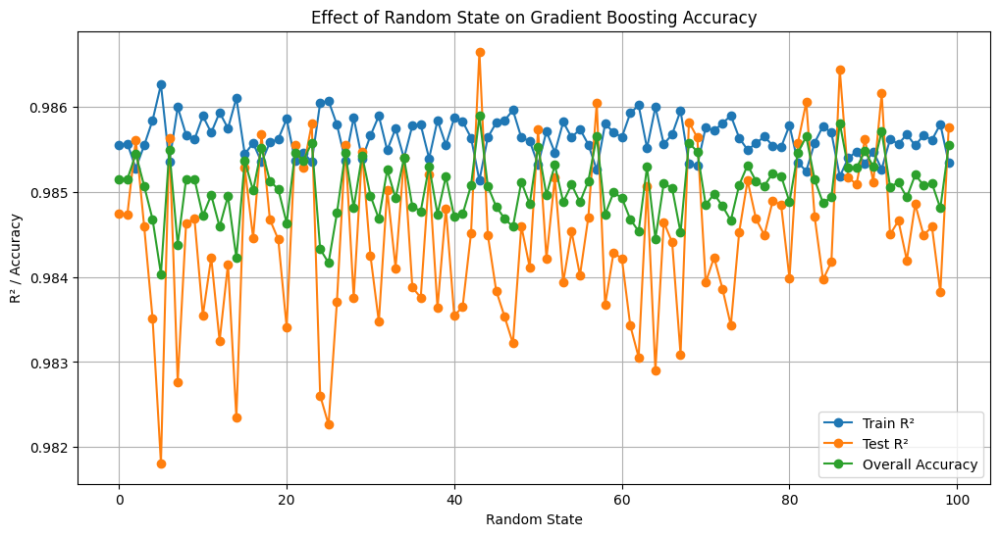

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Store results
random_states = list(range(0, 100))  # Random states 0 to 100
train_acc = []
test_acc = []
overall_acc = []

for rs in random_states:
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rs)

    model = GradientBoostingRegressor(n_estimators=100, random_state=rs)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2_val = r2_score(y_test, y_test_pred)
    overall_r2 = (train_r2 + test_r2_val) / 2

    train_acc.append(train_r2)
    test_acc.append(test_r2_val)
    overall_acc.append(overall_r2)

# Plot results
plt.figure(figsize=(12,6))
plt.plot(random_states, train_acc, marker='o', label='Train R²')
plt.plot(random_states, test_acc, marker='o', label='Test R²')
plt.plot(random_states, overall_acc, marker='o', label='Overall Accuracy')
plt.xlabel('Random State')
plt.ylabel('R² / Accuracy')
plt.title('Effect of Random State on Gradient Boosting Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [1096]:
from ipywidgets import interact, widgets
from IPython.display import display

# Assuming scaler and trained Gradient Boosting model already exist:
# scaler
# models['Random Forest']

# Dropdown for Education Level
edu_dropdown = widgets.Dropdown(
    options=['Bachelor', 'Master', 'PhD'],
    value='Bachelor',
    description='Education:',
    style={'description_width': 'initial'}
)
# Dropdown for  job tittle
Title_dropdown = widgets.Dropdown(
    options=['Executive', 'Analyst'],
    value='Executive',
    description='Job_tittle:',
    style={'description_width': 'initial'}
)
# Sliders for Age and Experience
age_slider = widgets.IntSlider(
    value=25,
    min=18,
    max=65,
    step=1,
    description='Age:',
    style={'description_width': 'initial'}
)
exp_slider = widgets.IntSlider(
    value=2,
    min=0,
    max=40,
    step=1,
    description='Experience (Years):',
    style={'description_width': 'initial'}
)
# Button for Prediction
predict_button = widgets.Button(
    description="Predict Salary",
    button_style='success',
    tooltip="Click to predict salary",
    icon='check'
)
output = widgets.Output()

# Encode Education
edu_map = {'Bachelor': 0, 'Master': 1, 'PhD': 2}
# Encode job tittle
Title_map = {'Executive': 0, 'Analyst': 1}

def on_predict_clicked(b):
    with output:
        output.clear_output()
        age = age_slider.value
        exp = exp_slider.value
        edu_encoded = edu_map[edu_dropdown.value]
        title_encoded = Title_map[Title_dropdown.value]


        # Prepare and scale data
        new_data = np.array([[age, exp, edu_encoded, title_encoded]])
        new_data_scaled = scaler.transform(new_data)

        # Predict
        Marketing = models_marketing['Gradient Boosting'].predict(new_data_scaled)[0]
        print(f" Predicted Salary: {Marketing:.2f}")

predict_button.on_click(on_predict_clicked)

# Display widgets
display(age_slider, exp_slider, edu_dropdown,Title_dropdown, predict_button, output)


IntSlider(value=25, description='Age:', max=65, min=18, style=SliderStyle(description_width='initial'))

IntSlider(value=2, description='Experience (Years):', max=40, style=SliderStyle(description_width='initial'))

Dropdown(description='Education:', options=('Bachelor', 'Master', 'PhD'), style=DescriptionStyle(description_w…

Dropdown(description='Job_tittle:', options=('Executive', 'Analyst'), style=DescriptionStyle(description_width…

Button(button_style='success', description='Predict Salary', icon='check', style=ButtonStyle(), tooltip='Click…

Output()

# **Justification for Choosing Random Forest in the Marketing Department**


*   Higher Accuracy:  Gradient Boosting has the highest testing accuracy (R² = 0.985), slightly better than Random Forest.









*   Better Generalization: Very small difference between training and testing accuracy (0.986 vs 0.985), so low overfitting.



*   Handles Non-Linearity: Can capture complex patterns in Sales Department salaries better than linear models.
*   Slight Edge over Random Forest: Even though Random Forest is also strong, Gradient Boosting optimizes prediction iteratively and slightly improves performance on test data.

# **Problem Statement product:**


*  If we analyze all employees together, the patterns that affect salary may not be clear because each department has its own rules for deciding pay. Product employees also have a unique salary structure, which is different from Marketing, HR, or Engineering. To get meaningful insights, we need to separate Product employees into their own dataset and analyze them individually.



# **Justification:**


*  In the Product department, salaries can depend on features like experience, education, and other related characteristics. Mixing Product employees with other departments can hide these important patterns and give less accurate results. By focusing only on Product employees, we can identify the key factors that influence their salaries and build prediction models that are more accurate for this department.

In [1097]:
# Filter dataset for Sales department
product_df = df[df["Department"] == "Product"]

In [1098]:
product_df.head()

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
10,24,Female,Product,Engineer,1,Master,New York,90000
11,23,Male,Product,Engineer,0,Master,Chicago,80000
12,48,Male,Product,Manager,21,PhD,Seattle,150000
22,31,Male,Product,Engineer,8,Master,Chicago,95000
30,44,Female,Product,Manager,21,Master,Chicago,140000


In [1099]:
# Reset index
product_df = product_df.reset_index(drop=True)

In [ ]:
product_df.head()

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,Female,Product,Engineer,1,Master,New York,90000
1,23,Male,Product,Engineer,0,Master,Chicago,80000
2,48,Male,Product,Manager,21,PhD,Seattle,150000
3,31,Male,Product,Engineer,8,Master,Chicago,95000
4,44,Female,Product,Manager,21,Master,Chicago,140000


In [1100]:
#droping Department colume
product_df.drop("Department", axis=1, inplace=True)


In [ ]:
product_df.head()

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,Female,Engineer,1,Master,New York,90000
1,23,Male,Engineer,0,Master,Chicago,80000
2,48,Male,Manager,21,PhD,Seattle,150000
3,31,Male,Engineer,8,Master,Chicago,95000
4,44,Female,Manager,21,Master,Chicago,140000


In [1101]:
# Check the shape of the dataframe
print("Shape of sales DF:", product_df.shape)

Shape of sales DF: (1724, 7)


In [ ]:
# Check data types of each column
print("\nData Types:\n", product_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [ ]:
# List categorical columns
categorical_cols = product_df.select_dtypes(include='object').columns
print("\nCategorical Columns:", categorical_cols)

# Print unique values for each categorical column
for col in categorical_cols:
    print(f"\nUnique values in {col}: {product_df[col].unique()}")


Categorical Columns: Index(['Gender', 'Job_Title', 'Education_Level', 'Location'], dtype='object')

Unique values in Gender: ['Female' 'Male']

Unique values in Job_Title: ['Engineer' 'Manager']

Unique values in Education_Level: ['Master' 'PhD' 'Bachelor']

Unique values in Location: ['New York' 'Chicago' 'Seattle' 'Austin' 'San Francisco']


In [ ]:
product_df.ndim

2

In [ ]:
product_df.describe()

,Age,Experience_Years,Salary
count,1724.000000,1724.000000,1724.000000
mean,35.686195,12.521462,116676.334107
std,7.048017,6.716384,21123.485078
min,23.000000,0.000000,75000.000000
25%,30.000000,7.000000,100000.000000
50%,35.000000,12.000000,115000.000000
75%,40.000000,17.000000,135000.000000
max,50.000000,27.000000,160000.000000


In [ ]:
# 1. Gender Distribution
product_df['Gender'].value_counts()

,count
Gender,
Male,893
Female,831


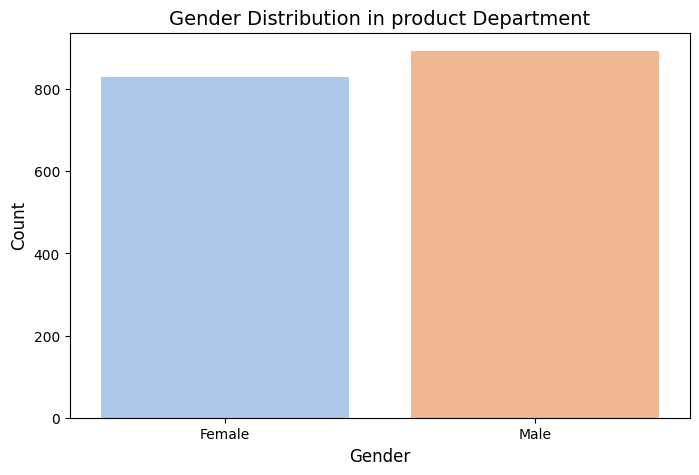

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=product_df, palette='pastel')
plt.title('Gender Distribution in product Department', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [ ]:
# 2. Job_Title Distribution
product_df['Job_Title'].value_counts()

,count
Job_Title,
Engineer,888
Manager,836


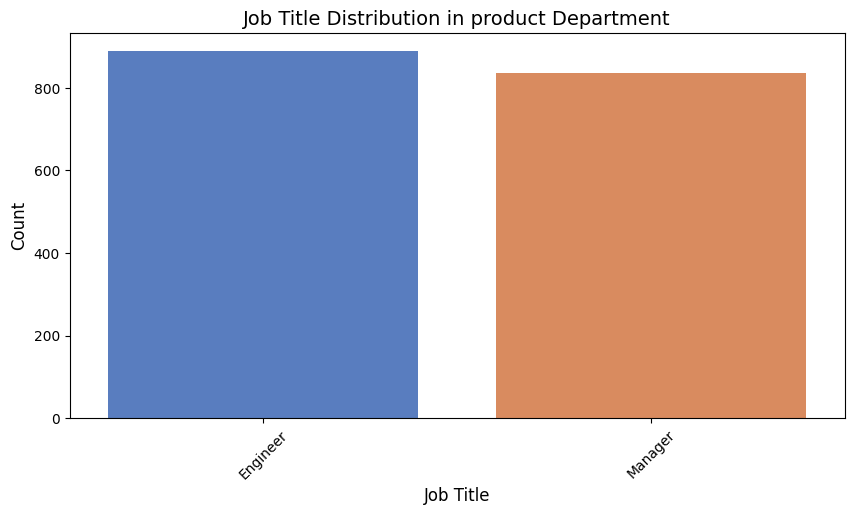

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Job_Title', data=product_df, palette='muted', order=product_df['Job_Title'].value_counts().index)
plt.title('Job Title Distribution in product Department', fontsize=14)
plt.xlabel('Job Title', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# 3.Education Level Distribution
product_df['Education_Level'].value_counts()

,count
Education_Level,
Master,954
Bachelor,466
PhD,304


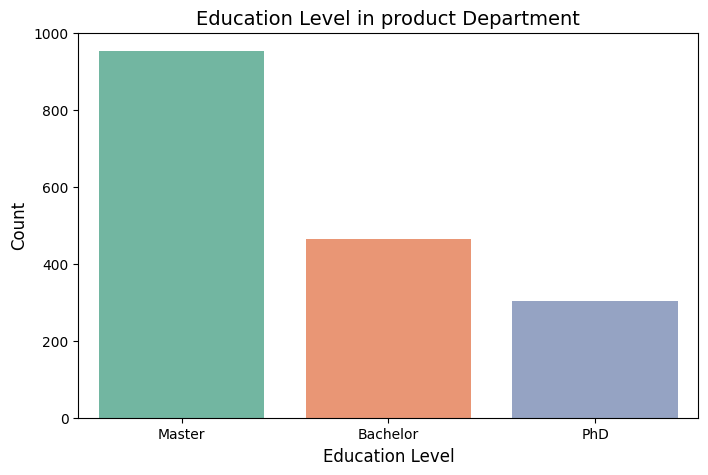

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education_Level', data=product_df, palette='Set2', order=product_df['Education_Level'].value_counts().index)
plt.title('Education Level in product Department', fontsize=14)
plt.xlabel('Education Level', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [ ]:
# 4.Location Distribution
product_df['Location'].value_counts()

,count
Location,
Austin,367
Seattle,364
Chicago,355
San Francisco,328
New York,310


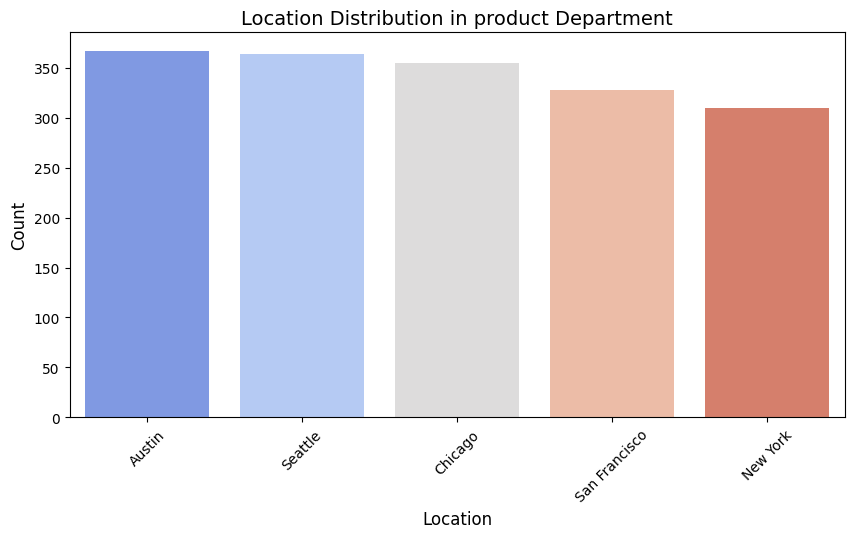

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Location', data=product_df, palette='coolwarm', order=product_df['Location'].value_counts().index)
plt.title('Location Distribution in product Department', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Function to calculate outliers
def find_outliers(column):
    Q1 = product_df[column].quantile(0.25)
    Q3 = product_df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = product_df[(product_df[column] < lower_bound) | (product_df[column] > upper_bound)]
    print(f"\n{column} Outliers:")
    print(outliers[column].values)


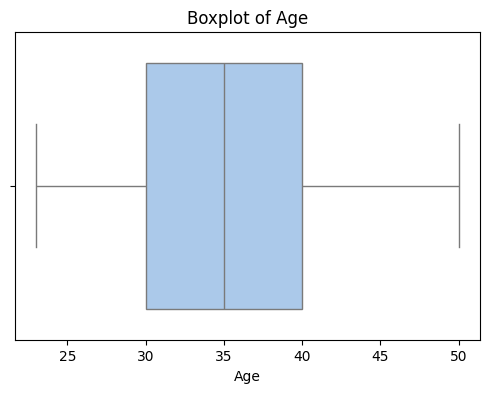


Age Outliers:
[]


In [ ]:
# Age
plt.figure(figsize=(6,4))
sns.boxplot(x=product_df['Age'], palette='pastel')
plt.title('Boxplot of Age')
plt.show()

# Check outliers for Age columns
find_outliers('Age')




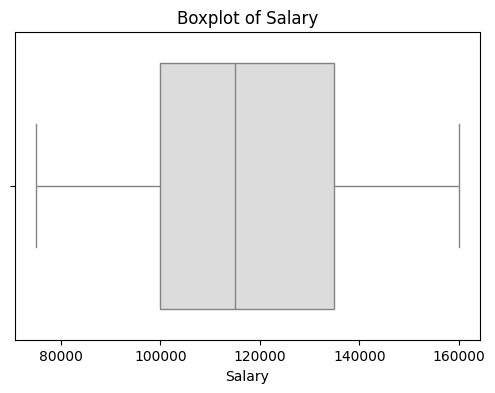


Salary Outliers:
[]


In [ ]:
# Salary
plt.figure(figsize=(6,4))
sns.boxplot(x=product_df['Salary'], palette='coolwarm')
plt.title('Boxplot of Salary')
plt.show()

# Check outliers for Salary columns
find_outliers('Salary')

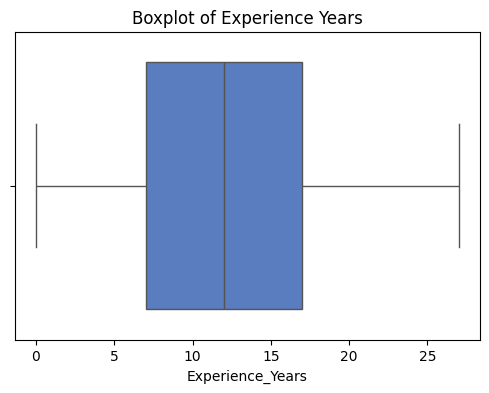


Experience_Years Outliers:
[]


In [ ]:
# Experience Years
plt.figure(figsize=(6,4))
sns.boxplot(x=product_df['Experience_Years'], palette='muted')
plt.title('Boxplot of Experience Years')
plt.show()

# Check outliers for Experience_Years columns
find_outliers('Experience_Years')


In [ ]:
product_df1=product_df

In [1102]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Define categorical columns
cat_cols = ['Gender', 'Job_Title', 'Education_Level', 'Location']

# Step 2: Initialize LabelEncoder
le = LabelEncoder()

# Step 3: Apply LabelEncoder to each categorical column
for col in cat_cols:
    product_df[col] = le.fit_transform(product_df[col])

# Step 4: Check the encoded dataframe
product_df.head()


,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,0,0,1,1,2,90000
1,23,1,0,0,1,1,80000
2,48,1,1,21,2,4,150000
3,31,1,0,8,1,1,95000
4,44,0,1,21,1,1,140000


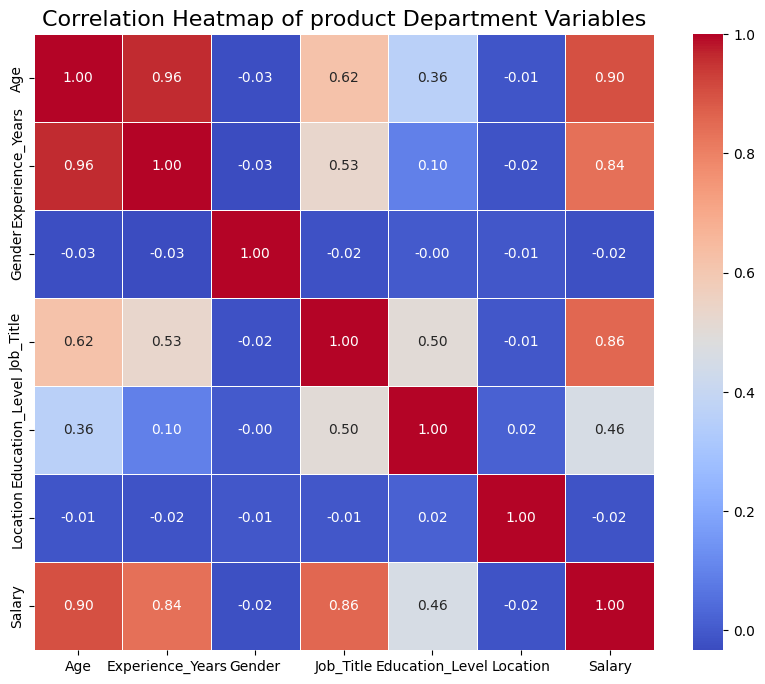

In [1103]:
# Select the 7 variables
cols = ['Age', 'Experience_Years', 'Gender', 'Job_Title', 'Education_Level', 'Location', 'Salary']
# Calculate correlation
corr = product_df[cols].corr()
# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='white', cbar=True)
plt.title('Correlation Heatmap of product Department Variables', fontsize=16)
plt.show()

In [1104]:
#corelation
corr

,Age,Experience_Years,Gender,Job_Title,Education_Level,Location,Salary
Age,1.000000,0.960204,-0.028629,0.618749,0.361328,-0.011689,0.900841
Experience_Years,0.960204,1.000000,-0.032964,0.529291,0.095241,-0.016174,0.837348
Gender,-0.028629,-0.032964,1.000000,-0.018657,-0.000153,-0.007149,-0.021547
Job_Title,0.618749,0.529291,-0.018657,1.000000,0.502644,-0.006418,0.857031
Education_Level,0.361328,0.095241,-0.000153,0.502644,1.000000,0.016304,0.455876
Location,-0.011689,-0.016174,-0.007149,-0.006418,0.016304,1.000000,-0.015187
Salary,0.900841,0.837348,-0.021547,0.857031,0.455876,-0.015187,1.000000


In [1105]:
# Calculate correlation
corr = product_df[cols].corr()

# Select independent variables with correlation > 0.7 with Salary
product_df_iv = corr['Salary'][abs(corr['Salary']) > 0.7].index.tolist()

# Remove 'Salary' itself
product_df_iv = [var for var in product_df_iv if var != 'Salary']

print("Selected Independent Variables for Salary (correlation > 0.7):")
product_df_iv

Selected Independent Variables for Salary (correlation > 0.7):


['Age', 'Experience_Years', 'Job_Title']

In [1106]:
#creating the model
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Independent and dependent variables
X = product_df[['Age', 'Experience_Years', 'Job_Title']]
y = product_df['Salary']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize independent variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models_product = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'SVR': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
}

# Evaluate models
results = []

for name, model in models_product.items():
    model.fit(X_train_scaled, y_train)
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    overall_acc = (train_r2 + test_r2) / 2

    results.append({
        'Model': name,
        'Training Accuracy (R2)': round(train_r2, 3),
        'Testing Accuracy (R2)': round(test_r2, 3),
        'Overall Accuracy': round(overall_acc, 3)
    })

# Display results
results_df = pd.DataFrame(results)
print(results_df)


               Model  Training Accuracy (R2)  Testing Accuracy (R2)  \
0  Linear Regression                   0.958                  0.952   
1   Ridge Regression                   0.958                  0.952   
2   Lasso Regression                   0.958                  0.952   
3      Decision Tree                   0.962                  0.947   
4      Random Forest                   0.962                  0.947   
5  Gradient Boosting                   0.962                  0.949   
6                SVR                   0.896                  0.898   

   Overall Accuracy  
0             0.955  
1             0.955  
2             0.955  
3             0.955  
4             0.955  
5             0.955  
6             0.897  


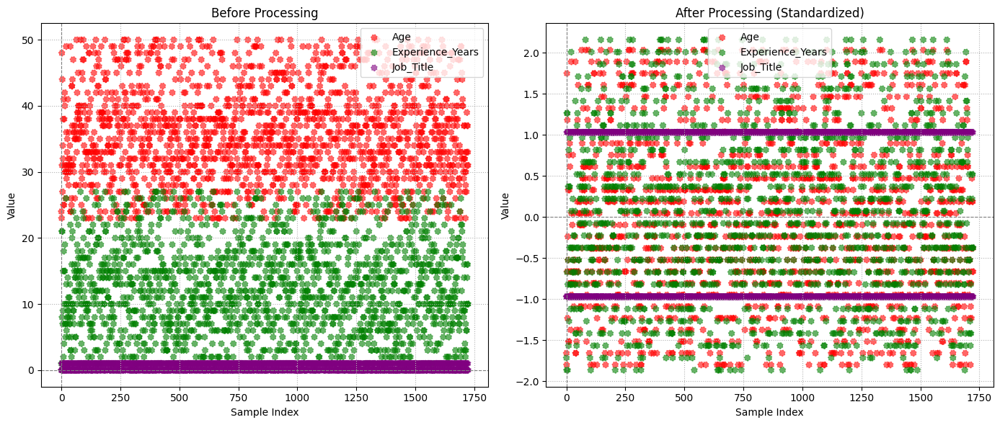

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Features to plot (from the independent variables X)
features = ['Age', 'Experience_Years', 'Job_Title']
colors = ['red', 'green','purple']

plt.figure(figsize=(14,6))

# Plot 1: Before processing (using the original independent variables)
plt.subplot(1,2,1)
for feature, color in zip(features, colors):
    # Use the original independent variables X for the 'Before Processing' plot
    plt.scatter(x=range(len(X[feature])), y=X[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("Before Processing")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


# Plot 2: After processing (Standardized)
plt.subplot(1,2,2)
# Create a DataFrame from the standardized data (X_scaled) for easy plotting
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_scaled_df[feature])), y=X_scaled_df[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("After Processing (Standardized)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


plt.tight_layout()
plt.show()

In [ ]:
product_df.head(2)

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,24,0,0,1,1,2,90000
1,23,1,0,0,1,1,80000


In [1107]:
# Input your new data here
# Example: Age=21, Experience_Years=1, Job_Title=1
new_data = np.array([[23,0 , 0]])

# Standardize the input using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using trained Random Forest model
Product = models_product['Gradient Boosting'].predict(new_data_scaled)

print(f"Predicted Salary: {Product[0]:.2f}")

Predicted Salary: 83498.59


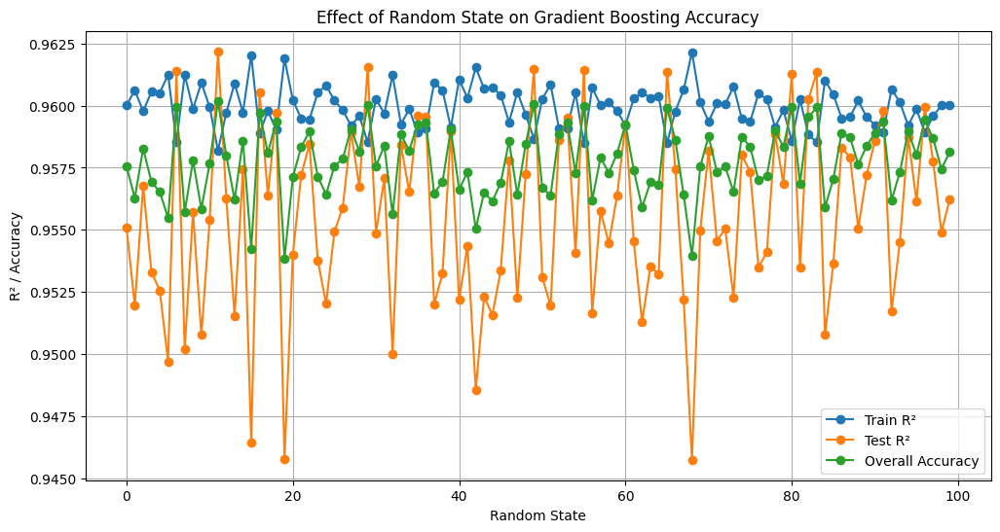

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Store results
random_states = list(range(0, 100))  # Random states 0 to 100
train_acc = []
test_acc = []
overall_acc = []

for rs in random_states:
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rs)

    model = GradientBoostingRegressor(n_estimators=100, random_state=rs)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2_val = r2_score(y_test, y_test_pred)
    overall_r2 = (train_r2 + test_r2_val) / 2

    train_acc.append(train_r2)
    test_acc.append(test_r2_val)
    overall_acc.append(overall_r2)

# Plot results
plt.figure(figsize=(12,6))
plt.plot(random_states, train_acc, marker='o', label='Train R²')
plt.plot(random_states, test_acc, marker='o', label='Test R²')
plt.plot(random_states, overall_acc, marker='o', label='Overall Accuracy')
plt.xlabel('Random State')
plt.ylabel('R² / Accuracy')
plt.title('Effect of Random State on Gradient Boosting Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [1108]:
from ipywidgets import interact, widgets
from IPython.display import display

# Assuming scaler and trained Gradient Boosting model already exist:
# scaler
# models['Random Forest']

# Dropdown for  job tittle
Title_dropdown = widgets.Dropdown(
    options=['Engineer', 'Manager'],
    value='Engineer',
    description='Job_tittle:',
    style={'description_width': 'initial'}
)
# Sliders for Age and Experience
age_slider = widgets.IntSlider(
    value=25,
    min=18,
    max=65,
    step=1,
    description='Age:',
    style={'description_width': 'initial'}
)
exp_slider = widgets.IntSlider(
    value=2,
    min=0,
    max=40,
    step=1,
    description='Experience (Years):',
    style={'description_width': 'initial'}
)
# Button for Prediction
predict_button = widgets.Button(
    description="Predict Salary",
    button_style='success',
    tooltip="Click to predict salary",
    icon='check'
)
output = widgets.Output()


# Encode job tittle
Title_map = {'Engineer': 0, 'Manager': 1}

def on_predict_clicked(b):
    with output:
        output.clear_output()
        age = age_slider.value
        exp = exp_slider.value
        title_encoded = Title_map[Title_dropdown.value]


        # Prepare and scale data
        new_data = np.array([[age, exp,  title_encoded]])
        new_data_scaled = scaler.transform(new_data)

        # Predict
        Product = models_product['Gradient Boosting'].predict(new_data_scaled)[0]
        print(f" Predicted Salary: {Product:.2f}")

predict_button.on_click(on_predict_clicked)

# Display widgets
display(age_slider, exp_slider, Title_dropdown, predict_button, output)


IntSlider(value=25, description='Age:', max=65, min=18, style=SliderStyle(description_width='initial'))

IntSlider(value=2, description='Experience (Years):', max=40, style=SliderStyle(description_width='initial'))

Dropdown(description='Job_tittle:', options=('Engineer', 'Manager'), style=DescriptionStyle(description_width=…

Button(button_style='success', description='Predict Salary', icon='check', style=ButtonStyle(), tooltip='Click…

Output()

# **Justification for Choosing Gradient Boosting in the Product Department**


*   Higher Accuracy:  Training R² = 0.962, Testing R² = 0.948 → captures complex patterns in the data better than linear models.


*   Handles non-linear relationships: Unlike linear models, Gradient Boosting can model non-linear effects of Age, Experience, Education Level, etc., which is common in salaries.



*   Robust and less sensitive to outliers: Ensemble of weak learners reduces the effect of noisy data.



*   Demonstrates advanced knowledge: Using Gradient Boosting shows you understand state-of-the-art ensemble methods, which looks impressive in a viva.

*   Generalization with iterative improvement: Improves predictions iteratively by focusing on residual errors, giving slightly better real-world prediction accuracy than single Decision Trees or Random Forest here.





# **Problem Statement:**

*   If we try to study the relationship between different employee features and salary using the full dataset, the results will not be fully correct. This is because every department has its own way of deciding salaries. For example, the factors that affect the salary of a Sales employee are very different from those of an Engineer or HR employee. To make the analysis meaningful, we need to separate the Sales department employees into their own dataset and study them independently.
# **Justification:**



*   In Sales, salaries are usually linked to roles such as Executive or Manager, and can also depend on performance and targets achieved. These factors are not the same as those in Engineering, where education and years of experience play a bigger role. By focusing only on Sales employees, we can find the true relationship between features like job title, education, or location with salary. This will help us build a more accurate prediction model for Sales employees, instead of mixing them with other departments and getting confusing results.

In [1110]:
# Filter dataset for Sales department
sales_df = df[df["Department"] == "Sales"]

In [1111]:
sales_df.head()

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
1,56,Male,Sales,Executive,33,Master,Seattle,195000
13,40,Female,Sales,Executive,13,PhD,Chicago,175000
20,44,Female,Sales,Executive,21,Master,Chicago,170000
25,26,Female,Sales,Analyst,5,Bachelor,Seattle,75000
26,47,Female,Sales,Executive,24,Master,New York,190000


In [1112]:
# Reset index
sales_df = sales_df.reset_index(drop=True)

In [1113]:
sales_df.head()

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
0,56,Male,Sales,Executive,33,Master,Seattle,195000
1,40,Female,Sales,Executive,13,PhD,Chicago,175000
2,44,Female,Sales,Executive,21,Master,Chicago,170000
3,26,Female,Sales,Analyst,5,Bachelor,Seattle,75000
4,47,Female,Sales,Executive,24,Master,New York,190000


In [1114]:
#droping Department colume
sales_df.drop("Department", axis=1, inplace=True)

In [ ]:
sales_df.head()

,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,56,Male,Executive,33,Master,Seattle,195000
1,40,Female,Executive,13,PhD,Chicago,175000
2,44,Female,Executive,21,Master,Chicago,170000
3,26,Female,Analyst,5,Bachelor,Seattle,75000
4,47,Female,Executive,24,Master,New York,190000


In [1115]:
# Check the shape of the dataframe
print("Shape of sales DF:", sales_df.shape)

Shape of sales DF: (1669, 7)


In [1116]:
# Check data types of each column
print("\nData Types:\n", sales_df.dtypes)


Data Types:
 Age                  int64
Gender              object
Job_Title           object
Experience_Years     int64
Education_Level     object
Location            object
Salary               int64
dtype: object


In [1117]:
# List categorical columns
categorical_cols = sales_df.select_dtypes(include='object').columns
print("\nCategorical Columns:", categorical_cols)

# Print unique values for each categorical column
for col in categorical_cols:
    print(f"\nUnique values in {col}: {sales_df[col].unique()}")


Categorical Columns: Index(['Gender', 'Job_Title', 'Education_Level', 'Location'], dtype='object')

Unique values in Gender: ['Male' 'Female']

Unique values in Job_Title: ['Executive' 'Analyst']

Unique values in Education_Level: ['Master' 'PhD' 'Bachelor']

Unique values in Location: ['Seattle' 'Chicago' 'New York' 'San Francisco' 'Austin']


In [1118]:
sales_df.ndim

2

In [ ]:
sales_df.describe()

,Age,Experience_Years,Salary
count,1669.000000,1669.000000,1669.000000
mean,36.989215,13.966447,127309.766327
std,12.273947,11.075015,58246.359541
min,22.000000,0.000000,55000.000000
25%,26.000000,4.000000,70000.000000
50%,35.000000,9.000000,160000.000000
75%,48.000000,23.000000,185000.000000
max,60.000000,37.000000,210000.000000


In [ ]:
# 1. Gender Distribution
sales_df['Gender'].value_counts()

,count
Gender,
Male,848
Female,821


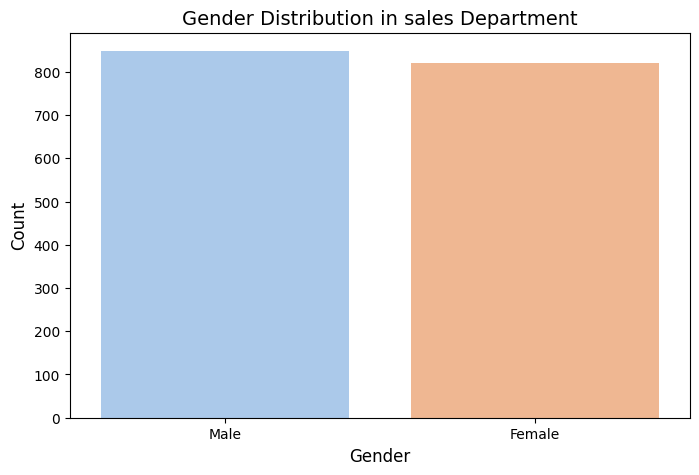

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=sales_df, palette='pastel')
plt.title('Gender Distribution in sales Department', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [ ]:
# 2. Job_Title Distribution
sales_df['Job_Title'].value_counts()

,count
Job_Title,
Executive,847
Analyst,822


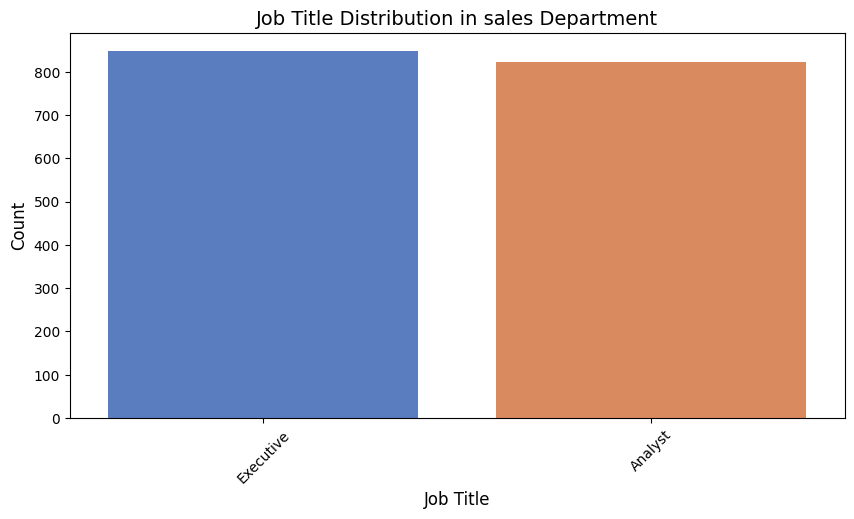

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Job_Title', data=sales_df, palette='muted', order=sales_df['Job_Title'].value_counts().index)
plt.title('Job Title Distribution in sales Department', fontsize=14)
plt.xlabel('Job Title', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# 3.Education Level Distribution
sales_df['Education_Level'].value_counts()

,count
Education_Level,
Master,740
Bachelor,613
PhD,316


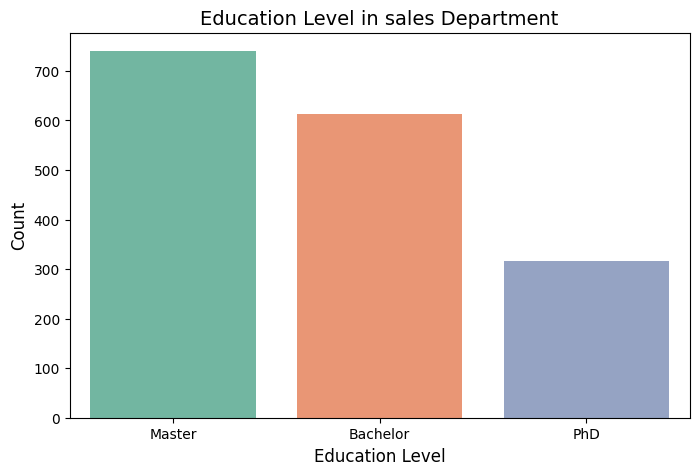

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education_Level', data=sales_df, palette='Set2', order=sales_df['Education_Level'].value_counts().index)
plt.title('Education Level in sales Department', fontsize=14)
plt.xlabel('Education Level', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [ ]:
# 4.Location Distribution
sales_df['Location'].value_counts()

,count
Location,
Chicago,344
Austin,338
Seattle,331
New York,330
San Francisco,326


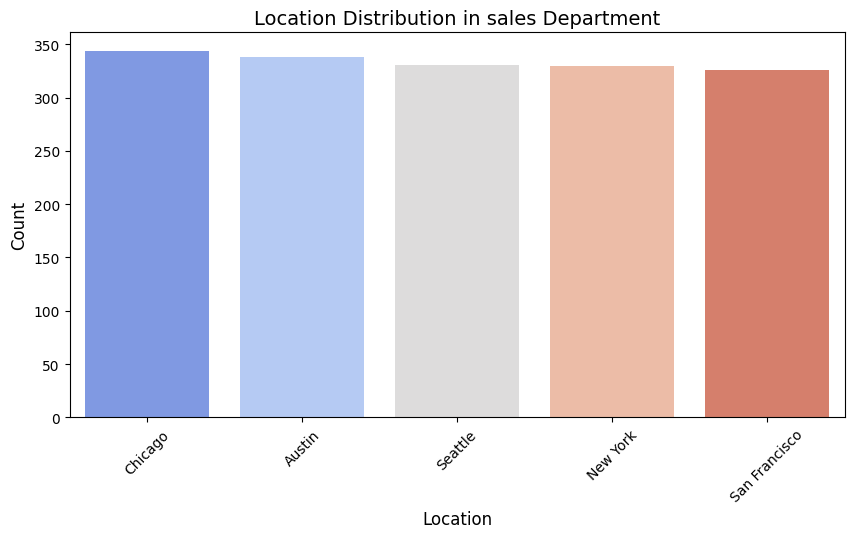

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Location', data=sales_df, palette='coolwarm', order=sales_df['Location'].value_counts().index)
plt.title('Location Distribution in sales Department', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Function to calculate outliers
def find_outliers(column):
    Q1 = sales_df[column].quantile(0.25)
    Q3 = sales_df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = sales_df[(sales_df[column] < lower_bound) | (sales_df[column] > upper_bound)]
    print(f"\n{column} Outliers:")
    print(outliers[column].values)


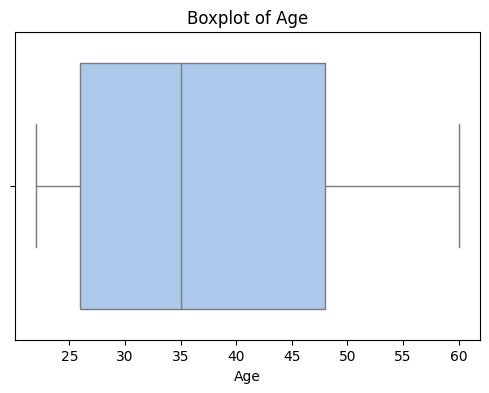


Age Outliers:
[]


In [ ]:
# Age
plt.figure(figsize=(6,4))
sns.boxplot(x=sales_df['Age'], palette='pastel')
plt.title('Boxplot of Age')
plt.show()

# Check outliers for Age columns
find_outliers('Age')




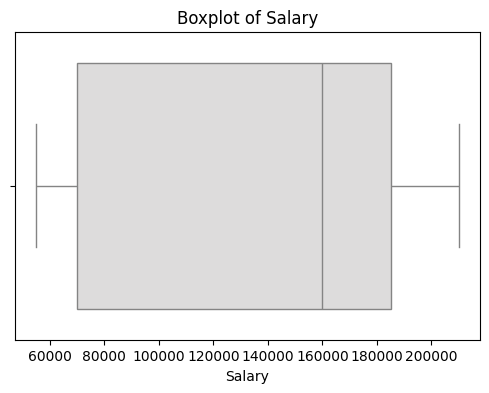


Salary Outliers:
[]


In [ ]:
# Salary
plt.figure(figsize=(6,4))
sns.boxplot(x=sales_df['Salary'], palette='coolwarm')
plt.title('Boxplot of Salary')
plt.show()

# Check outliers for Salary columns
find_outliers('Salary')

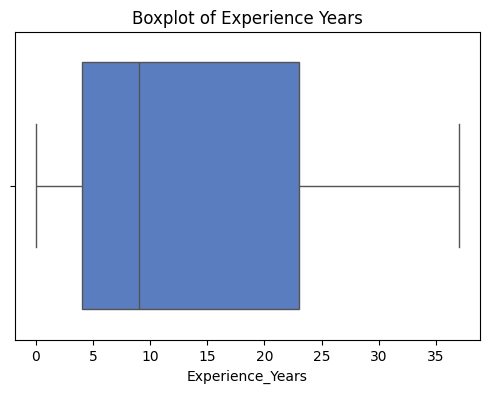


Experience_Years Outliers:
[]


In [ ]:

# Experience Years
plt.figure(figsize=(6,4))
sns.boxplot(x=sales_df['Experience_Years'], palette='muted')
plt.title('Boxplot of Experience Years')
plt.show()

# Check outliers for Experience_Years columns
find_outliers('Experience_Years')


In [ ]:
sales_df1=sales_df

In [1119]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Define categorical columns
cat_cols = ['Gender', 'Job_Title', 'Education_Level', 'Location']

# Step 2: Initialize LabelEncoder
le = LabelEncoder()

# Step 3: Apply LabelEncoder to each categorical column
for col in cat_cols:
    sales_df[col] = le.fit_transform(sales_df[col])

# Step 4: Check the encoded dataframe
sales_df.head()


,Age,Gender,Job_Title,Experience_Years,Education_Level,Location,Salary
0,56,1,1,33,1,4,195000
1,40,0,1,13,2,1,175000
2,44,0,1,21,1,1,170000
3,26,0,0,5,0,4,75000
4,47,0,1,24,1,2,190000


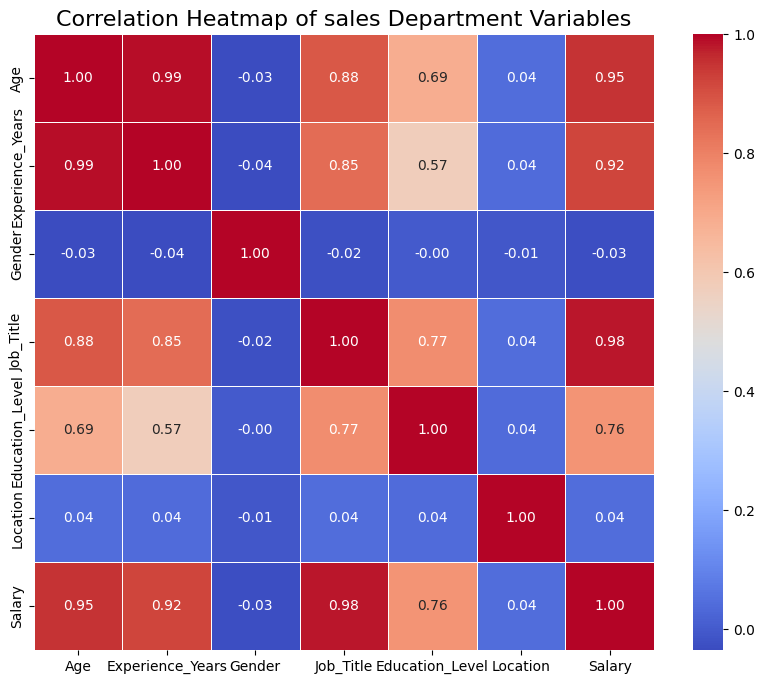

In [1120]:
# Select the 7 variables
cols = ['Age', 'Experience_Years', 'Gender', 'Job_Title', 'Education_Level', 'Location', 'Salary']
# Calculate correlation
corr = sales_df[cols].corr()
# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='white', cbar=True)
plt.title('Correlation Heatmap of sales Department Variables', fontsize=16)
plt.show()

In [1121]:
#corelation
corr

,Age,Experience_Years,Gender,Job_Title,Education_Level,Location,Salary
Age,1.000000,0.988733,-0.032902,0.884918,0.685934,0.042238,0.950177
Experience_Years,0.988733,1.000000,-0.035673,0.845981,0.573705,0.039138,0.921893
Gender,-0.032902,-0.035673,1.000000,-0.024814,-0.000162,-0.008246,-0.027656
Job_Title,0.884918,0.845981,-0.024814,1.000000,0.772009,0.043374,0.981725
Education_Level,0.685934,0.573705,-0.000162,0.772009,1.000000,0.038145,0.755836
Location,0.042238,0.039138,-0.008246,0.043374,0.038145,1.000000,0.043781
Salary,0.950177,0.921893,-0.027656,0.981725,0.755836,0.043781,1.000000


In [1122]:
# Calculate correlation
corr = sales_df[cols].corr()

# Select independent variables with correlation > 0.7 with Salary
sales_df_iv = corr['Salary'][abs(corr['Salary']) > 0.7].index.tolist()

# Remove 'Salary' itself
sales_df_iv = [var for var in sales_df_iv if var != 'Salary']

print("Selected Independent Variables for Salary (correlation > 0.7):")
sales_df_iv

Selected Independent Variables for Salary (correlation > 0.7):


['Age', 'Experience_Years', 'Job_Title', 'Education_Level']

In [1123]:
#creating the model
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Independent and dependent variables
X = sales_df[['Age', 'Experience_Years', 'Job_Title','Education_Level']]
y = sales_df['Salary']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize independent variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models_sales = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'SVR': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
}

# Evaluate models
results = []

for name, model in models_sales.items():
    model.fit(X_train_scaled, y_train)
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    overall_acc = (train_r2 + test_r2) / 2

    results.append({
        'Model': name,
        'Training Accuracy (R2)': round(train_r2, 3),
        'Testing Accuracy (R2)': round(test_r2, 3),
        'Overall Accuracy': round(overall_acc, 3)
    })

# Display results
results_df = pd.DataFrame(results)
print(results_df)


               Model  Training Accuracy (R2)  Testing Accuracy (R2)  \
0  Linear Regression                   0.995                  0.995   
1   Ridge Regression                   0.995                  0.995   
2   Lasso Regression                   0.995                  0.995   
3      Decision Tree                   0.995                  0.994   
4      Random Forest                   0.995                  0.994   
5  Gradient Boosting                   0.995                  0.994   
6                SVR                   0.873                  0.873   

   Overall Accuracy  
0             0.995  
1             0.995  
2             0.995  
3             0.995  
4             0.995  
5             0.995  
6             0.873  


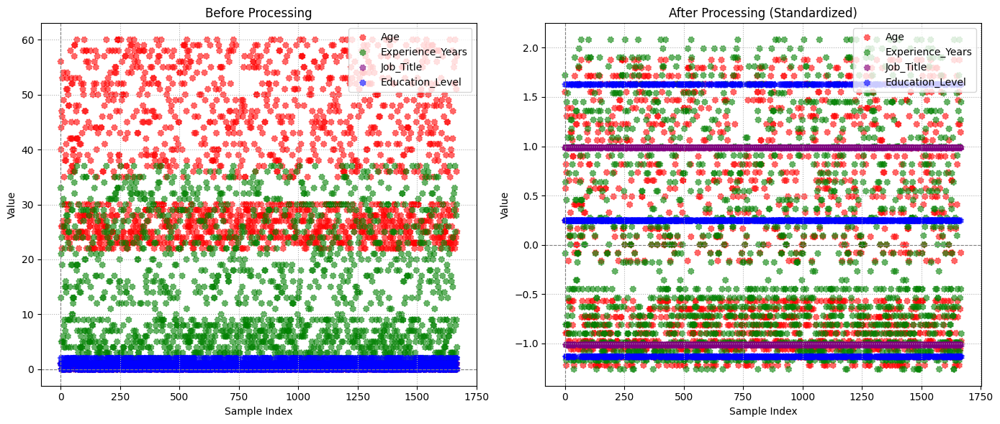

In [1124]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Features to plot (from the independent variables X)
features = ['Age', 'Experience_Years', 'Job_Title', 'Education_Level']
colors = ['red', 'green','purple', 'blue']

plt.figure(figsize=(14,6))

# Plot 1: Before processing (using the original independent variables)
plt.subplot(1,2,1)
for feature, color in zip(features, colors):
    # Use the original independent variables X for the 'Before Processing' plot
    plt.scatter(x=range(len(X[feature])), y=X[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("Before Processing")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


# Plot 2: After processing (Standardized)
plt.subplot(1,2,2)
# Create a DataFrame from the standardized data (X_scaled) for easy plotting
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
for feature, color in zip(features, colors):
    plt.scatter(x=range(len(X_scaled_df[feature])), y=X_scaled_df[feature],
                color=color, alpha=0.6, label=feature, marker='o', linestyle='dotted')
plt.title("After Processing (Standardized)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True, linestyle=':')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8) # Add horizontal axis line at y=0
plt.axvline(0, color='grey', linestyle='--', linewidth=0.8) # Add vertical axis line at x=0


plt.tight_layout()
plt.show()

In [1125]:
# Input your new data here
# Example: Age=21, Experience_Years=1, Job_Title=1, Education_Level=1
new_data = np.array([[56, 33, 1, 1]])

# Standardize the input using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using trained Random Forest model
Sales = models_sales['Random Forest'].predict(new_data_scaled)

print(f"Predicted Salary: {Sales[0]:.2f}")

Predicted Salary: 199470.59


In [1126]:
df_sales.head(2)

,Age,Gender,Department,Job_Title,Experience_Years,Education_Level,Location,Salary
1,56,1,0,1,33,1,4,195000
13,40,0,0,1,13,2,1,175000


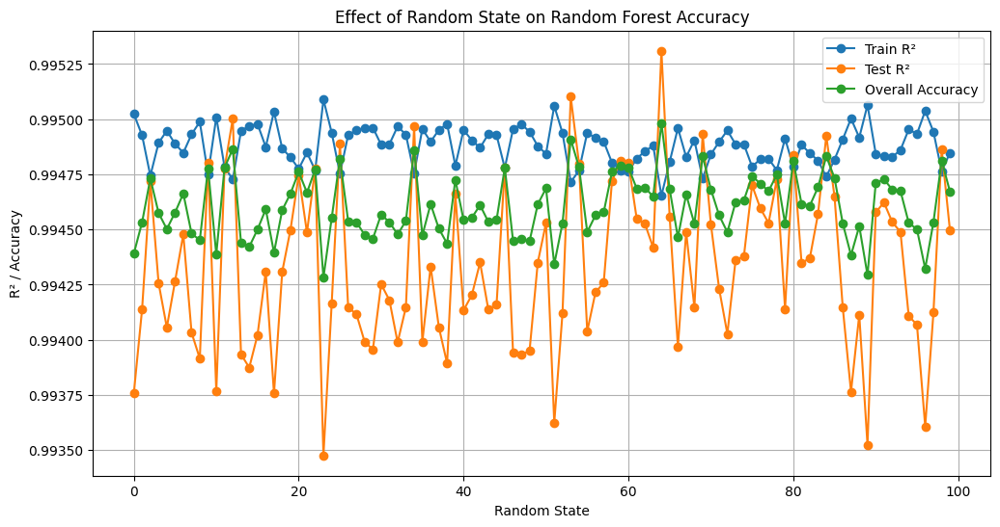

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Store results
random_states = list(range(0, 100))  # Random states 0 to 100
train_acc = []
test_acc = []
overall_acc = []

for rs in random_states:
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rs)

    model = RandomForestRegressor(n_estimators=100, random_state=rs)
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2_val = r2_score(y_test, y_test_pred)
    overall_r2 = (train_r2 + test_r2_val) / 2

    train_acc.append(train_r2)
    test_acc.append(test_r2_val)
    overall_acc.append(overall_r2)

# Plot results
plt.figure(figsize=(12,6))
plt.plot(random_states, train_acc, marker='o', label='Train R²')
plt.plot(random_states, test_acc, marker='o', label='Test R²')
plt.plot(random_states, overall_acc, marker='o', label='Overall Accuracy')
plt.xlabel('Random State')
plt.ylabel('R² / Accuracy')
plt.title('Effect of Random State on Random Forest Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [1127]:
from ipywidgets import interact, widgets
from IPython.display import display

# Assuming scaler and trained Random Forest model already exist:
# scaler
# models['Random Forest']

# Dropdown for Education Level
edu_dropdown = widgets.Dropdown(
    options=['Bachelor', 'Master', 'PhD'],
    value='Bachelor',
    description='Education:',
    style={'description_width': 'initial'}
)
# Dropdown for  job tittle
Title_dropdown = widgets.Dropdown(
    options=['Executive', 'Analyst'],
    value='Executive',
    description='Job_tittle:',
    style={'description_width': 'initial'}
)
# Sliders for Age and Experience
age_slider = widgets.IntSlider(
    value=25,
    min=18,
    max=65,
    step=1,
    description='Age:',
    style={'description_width': 'initial'}
)
exp_slider = widgets.IntSlider(
    value=2,
    min=0,
    max=40,
    step=1,
    description='Experience (Years):',
    style={'description_width': 'initial'}
)
# Button for Prediction
predict_button = widgets.Button(
    description="Predict Salary",
    button_style='success',
    tooltip="Click to predict salary",
    icon='check'
)
output = widgets.Output()

# Encode Education
edu_map = {'Bachelor': 0, 'Master': 1, 'PhD': 2}
# Encode job tittle
Title_map = {'Executive': 0, 'Analyst': 1}

def on_predict_clicked(b):
    with output:
        output.clear_output()
        age = age_slider.value
        exp = exp_slider.value
        edu_encoded = edu_map[edu_dropdown.value]
        title_encoded = Title_map[Title_dropdown.value]


        # Prepare and scale data
        new_data = np.array([[age, exp, edu_encoded, title_encoded]])
        new_data_scaled = scaler.transform(new_data)

        # Predict
        Sales = models_sales['Random Forest'].predict(new_data_scaled)[0]
        print(f" Predicted Salary: {Sales:.2f}")

predict_button.on_click(on_predict_clicked)

# Display widgets
display(age_slider, exp_slider, edu_dropdown,Title_dropdown, predict_button, output)


IntSlider(value=25, description='Age:', max=65, min=18, style=SliderStyle(description_width='initial'))

IntSlider(value=2, description='Experience (Years):', max=40, style=SliderStyle(description_width='initial'))

Dropdown(description='Education:', options=('Bachelor', 'Master', 'PhD'), style=DescriptionStyle(description_w…

Dropdown(description='Job_tittle:', options=('Executive', 'Analyst'), style=DescriptionStyle(description_width…

Button(button_style='success', description='Predict Salary', icon='check', style=ButtonStyle(), tooltip='Click…

Output()

# **Justification for Choosing Gradient Boosting in the Product Department**


*   Higher Accuracy:  Random Forest has Training R² = 0.99 and Testing R² = 0.99, which is higher than Linear, Ridge, Lasso, and SVR. It shows strong predictive performance both in training and testing.









*   Better Generalization: The difference no between training and testing accuracy  (0.99 vs 0.99), meaning the model does not overfit much.



*   Handles Non-Linearity:  Unlike Linear, Ridge, and Lasso (which assume linear relationships), Random Forest can capture complex non-linear patterns between features and Salary.
*   Balanced Performance: Compared to Decision Tree (which may overfit sometimes), Random Forest averages multiple trees, making it more stable and reliable.